In [3]:
library(ArchR)
library(Signac)
set.seed(1)
addArchRThreads(threads = 1)
addArchRGenome("mm10")
library(tidyverse)
library(here)
library(Seurat)
library(gt)
library(ChIPseeker)
library(TxDb.Mmusculus.UCSC.mm10.knownGene)
txdb <- TxDb.Mmusculus.UCSC.mm10.knownGene
library(clusterProfiler)
library(ReactomePA)
library(DOSE)
#plot track
library(scATACutils)
library(dplyr)
library(readr)
library(ggplot2)
library(org.Mm.eg.db)
library(ggpubr)

Loading required package: ggplot2

Loading required package: SummarizedExperiment

Loading required package: GenomicRanges

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    unio

ERROR: Error: package or namespace load failed for ‘Signac’ in loadNamespace(j <- i[[1L]], c(lib.loc, .libPaths()), versionCheck = vI[[j]]):
 namespace ‘Seurat’ 3.0.0 is being loaded, but >= 3.2.0 is required


### 1. Import bam files into ArchR

In [53]:
frag.files = c("~/Gonocyte/Raw_data/E18/frag_bap.2/final/alignments.possorted.tagged.bap.fragments.tsv.gz",
               "~/Gonocyte/Raw_data/P0/frag_bap.2/final/alignments.possorted.tagged.bap.fragments.tsv.gz",
              "~/Gonocyte/Raw_data/P3/frag_bap.2/final/alignments.possorted.tagged.bap.fragments.tsv.gz",
              "~/Gonocyte/Raw_data/P6/frag_bap.2/final/alignments.possorted.tagged.bap.fragments.tsv.gz")

In [60]:
ArrowFiles <- createArrowFiles(inputFiles = frag.files,
                               sampleNames = c("E18.2","P0.2","P3.2","P6.2"),
                               filterTSS = 4, 
                               filterFrags = 1000,  
                               addTileMat = TRUE,
                               addGeneScoreMat = TRUE,
                               excludeChr = c("chrM"),
                               force = TRUE
                              )

Using GeneAnnotation set by addArchRGenome(Mm10)!

Using GeneAnnotation set by addArchRGenome(Mm10)!

ArchR logging to : ArchRLogs/ArchR-createArrows-742b47812606-Date-2020-10-08_Time-15-14-02.log
If there is an issue, please report to github with logFile!

Cleaning Temporary Files

2020-10-08 15:14:02 : Batch Execution w/ safelapply!, 0 mins elapsed.

(P3.2 : 1 of 4) Checking if completed file exists!

2020-10-08 15:14:02 : (P3.2 : 1 of 4) Arrow Exists! Overriding since force = TRUE!, 0 mins elapsed.

(P3.2 : 1 of 4) Determining Arrow Method to use!

2020-10-08 15:14:02 : (P3.2 : 1 of 4) Reading In Fragments from inputFiles (readMethod = tabix), 0.002 mins elapsed.

2020-10-08 15:14:02 : (P3.2 : 1 of 4) Tabix Bed To Temporary File, 0.002 mins elapsed.

2020-10-08 15:15:58 : (P3.2 : 1 of 4) Reading TabixFile 10 Percent, 1.924 mins elapsed.

2020-10-08 15:17:45 : (P3.2 : 1 of 4) Reading TabixFile 19 Percent, 3.706 mins elapsed.

2020-10-08 15:20:00 : (P3.2 : 1 of 4) Reading TabixFile 29

In [ ]:
doubScores <- addDoubletScores(
    input = ArrowFiles,
    k = 10, #Refers to how many cells near a "pseudo-doublet" to count.
    knnMethod = "LSI", #Refers to the embedding to use for nearest neighbor search with doublet projection.
    LSIMethod = 1,
    threads=4,
    LSIParams = list(
        outlierQuantiles = c(0.02, 0.98), 
        filterBias = FALSE,iterations = 3, 
        UMAPParams = list(
        n_neighbors = 40, 
        min_dist = 0.4, 
        metric = "cosine", 
        verbose = FALSE, 
        fast_sgd = TRUE),
        clusterParams = list( #See Seurat::FindClusters
        resolution = c(1.5), 
        sampleCells = 10000, 
        n.start = 10,
        algorithm=2
    ), 
    varFeatures = 200000, 
    dimsToUse = 1:30),
    force = TRUE
)


Merged.proj <- ArchRProject(
  ArrowFiles = ArrowFiles, 
  outputDirectory = "Allcell.202009.wodoublet.filtering",
  copyArrows = TRUE #This is recommened so that if you modify the Arrow files you have an original copy for later usage.
)




ArchR logging to : ArchRLogs/ArchR-addDoubletScores-742b12a019de-Date-2020-10-08_Time-17-48-09.log
If there is an issue, please report to github with logFile!

2020-10-08 17:48:09 : Batch Execution w/ safelapply!, 0 mins elapsed.

2020-10-08 17:48:09 : P3.2 (1 of 4) :  Computing Doublet Statistics, 0 mins elapsed.



# 2. Filtering doublet using default setting

Filtering 2345 cells from ArchRProject!

	P3.2 : 533 of 6669 (8%)

	E18.2 : 603 of 7092 (8.5%)

	P0.2 : 570 of 6898 (8.3%)

	P6.2 : 639 of 7299 (8.8%)

Filtering 1953 cells from ArchRProject!

	P3.2 : 444 of 6669 (6.7%)

	E18.2 : 502 of 7092 (7.1%)

	P0.2 : 475 of 6898 (6.9%)

	P6.2 : 532 of 7299 (7.3%)

Filtering 2442 cells from ArchRProject!

	P3.2 : 555 of 6669 (8.3%)

	E18.2 : 628 of 7092 (8.9%)

	P0.2 : 594 of 6898 (8.6%)

	P6.2 : 665 of 7299 (9.1%)



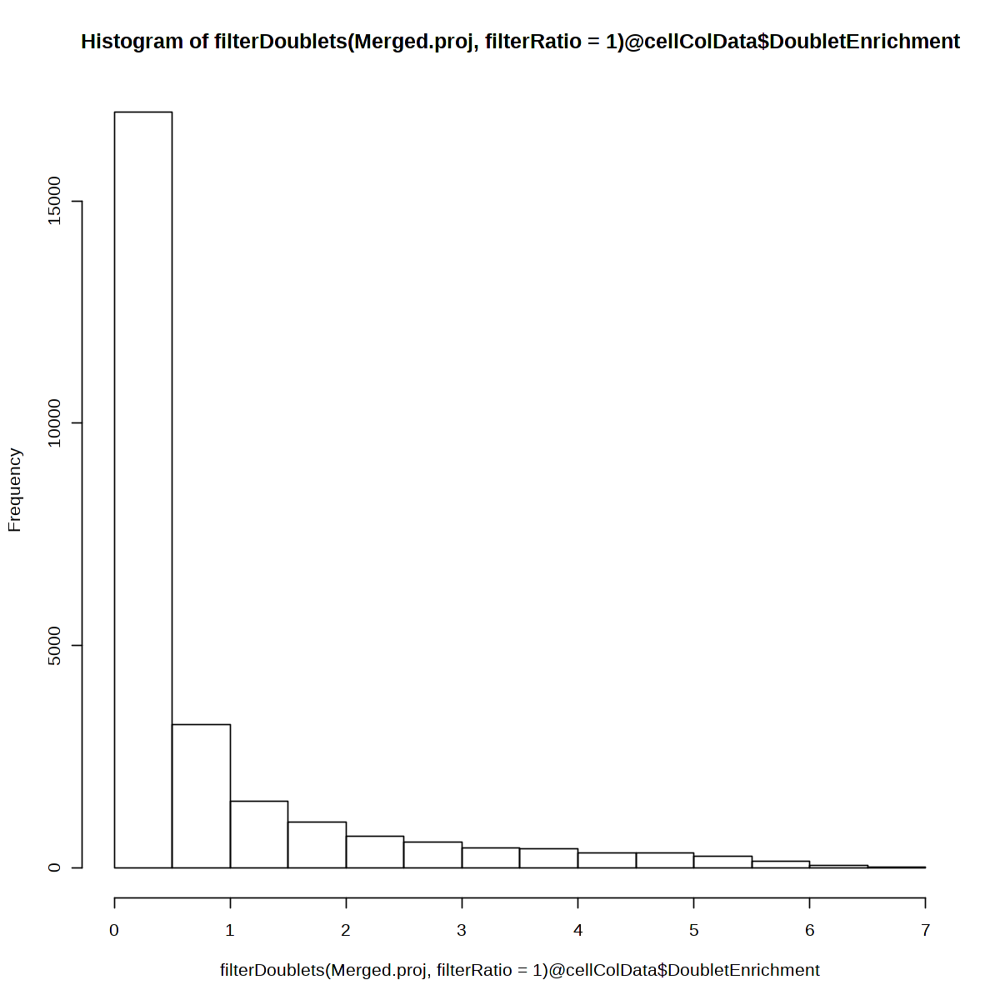

Filtering 2345 cells from ArchRProject!

	P3.2 : 533 of 6669 (8%)

	E18.2 : 603 of 7092 (8.5%)

	P0.2 : 570 of 6898 (8.3%)

	P6.2 : 639 of 7299 (8.8%)



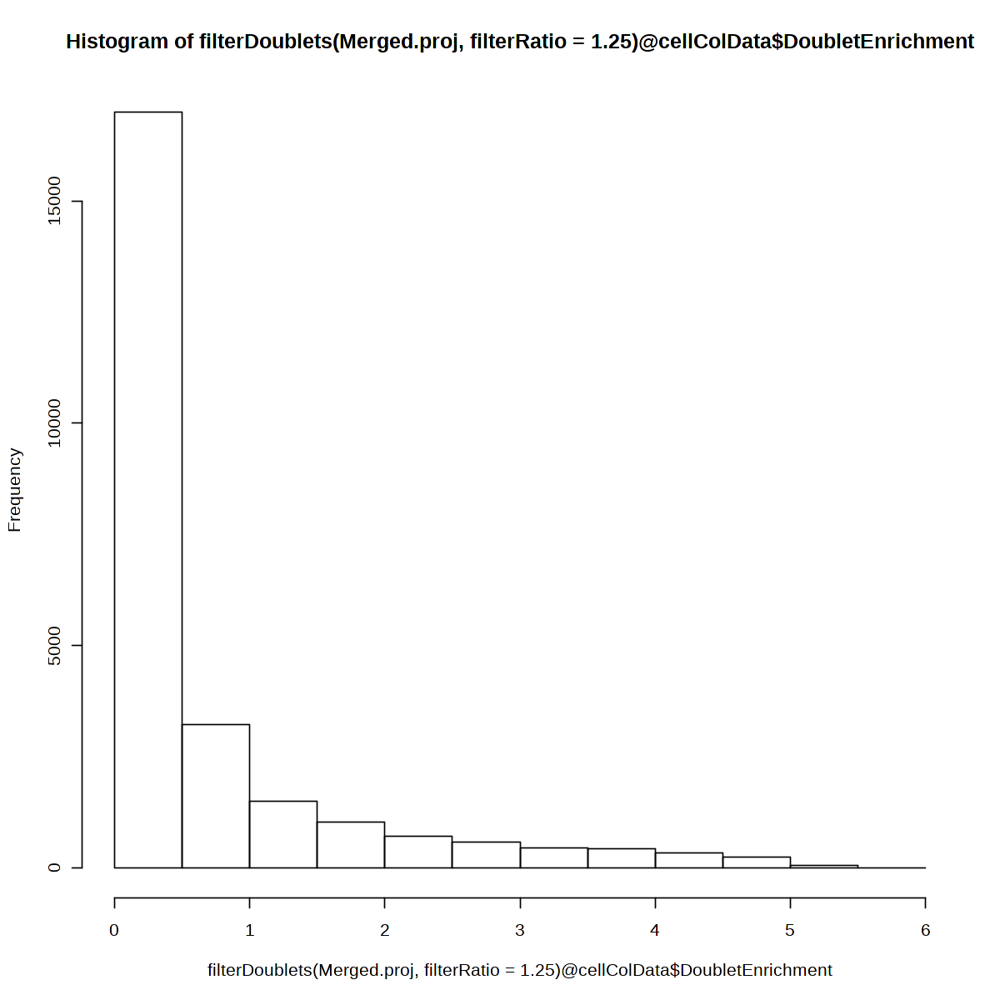

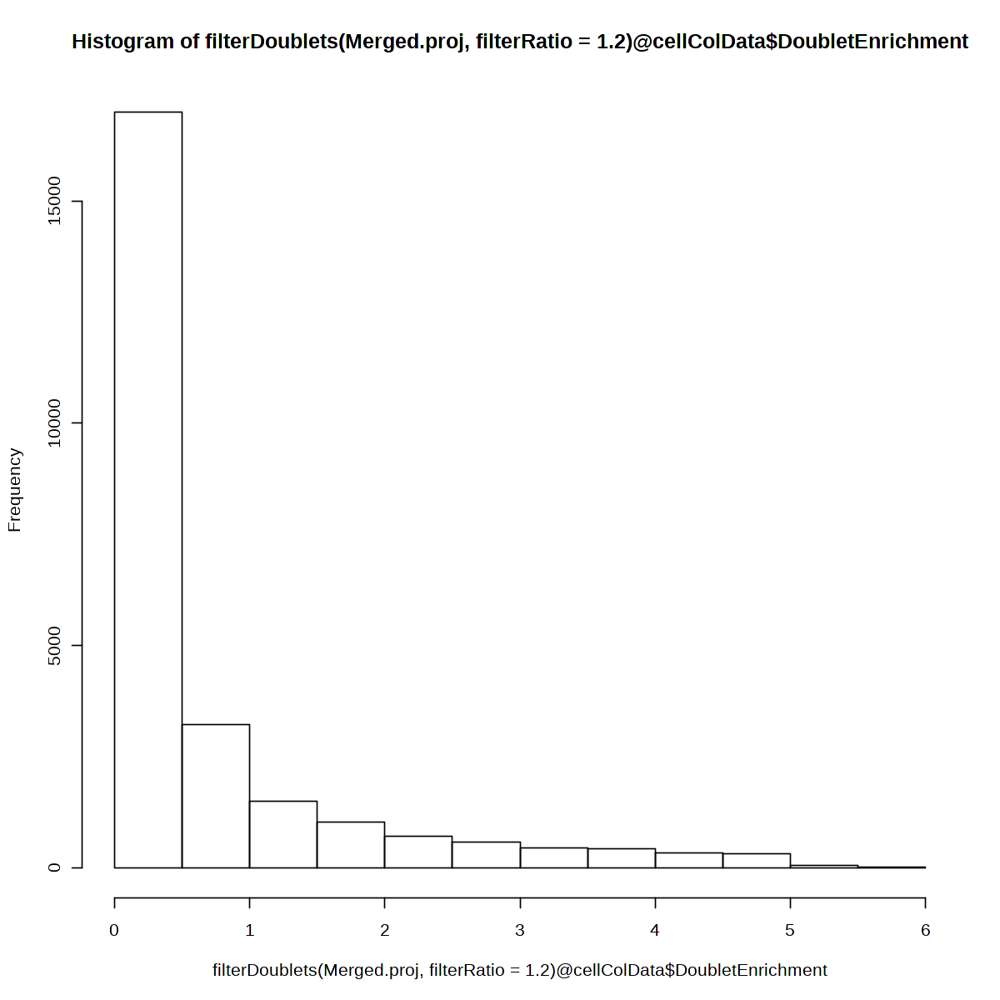

In [68]:
Merged.proj2 <- filterDoublets(Merged.proj,filterRatio = 1.2)
hist(filterDoublets(Merged.proj,filterRatio = 1)@cellColData$DoubletEnrichment)
hist(filterDoublets(Merged.proj,filterRatio = 1.25)@cellColData$DoubletEnrichment)
hist(filterDoublets(Merged.proj,filterRatio = 1.2)@cellColData$DoubletEnrichment)

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-742b7c6597e-Date-2020-10-09_Time-23-46-47.log
If there is an issue, please report to github with logFile!

2020-10-09 23:46:47 : Computing Total Accessibility Across All Features, 0.003 mins elapsed.

2020-10-09 23:46:49 : Computing Top Features, 0.037 mins elapsed.

###########
2020-10-09 23:46:50 : Running LSI (1 of 3) on Top Features, 0.042 mins elapsed.
###########

2020-10-09 23:46:50 : Sampling Cells (N = 10002) for Estimated LSI, 0.043 mins elapsed.

2020-10-09 23:46:50 : Creating Sampled Partial Matrix, 0.043 mins elapsed.

2020-10-09 23:47:07 : Computing Estimated LSI (projectAll = FALSE), 0.327 mins elapsed.

2020-10-09 23:49:31 : Identifying Clusters, 2.734 mins elapsed.

2020-10-09 23:49:52 : Identified 17 Clusters, 3.086 mins elapsed.

2020-10-09 23:49:52 : Saving LSI Iteration, 3.086 mins elapsed.

2020-10-09 23:50:20 : Creating Cluster Matrix on the total Group Features, 3.543 mins elapsed.

2020-10-0

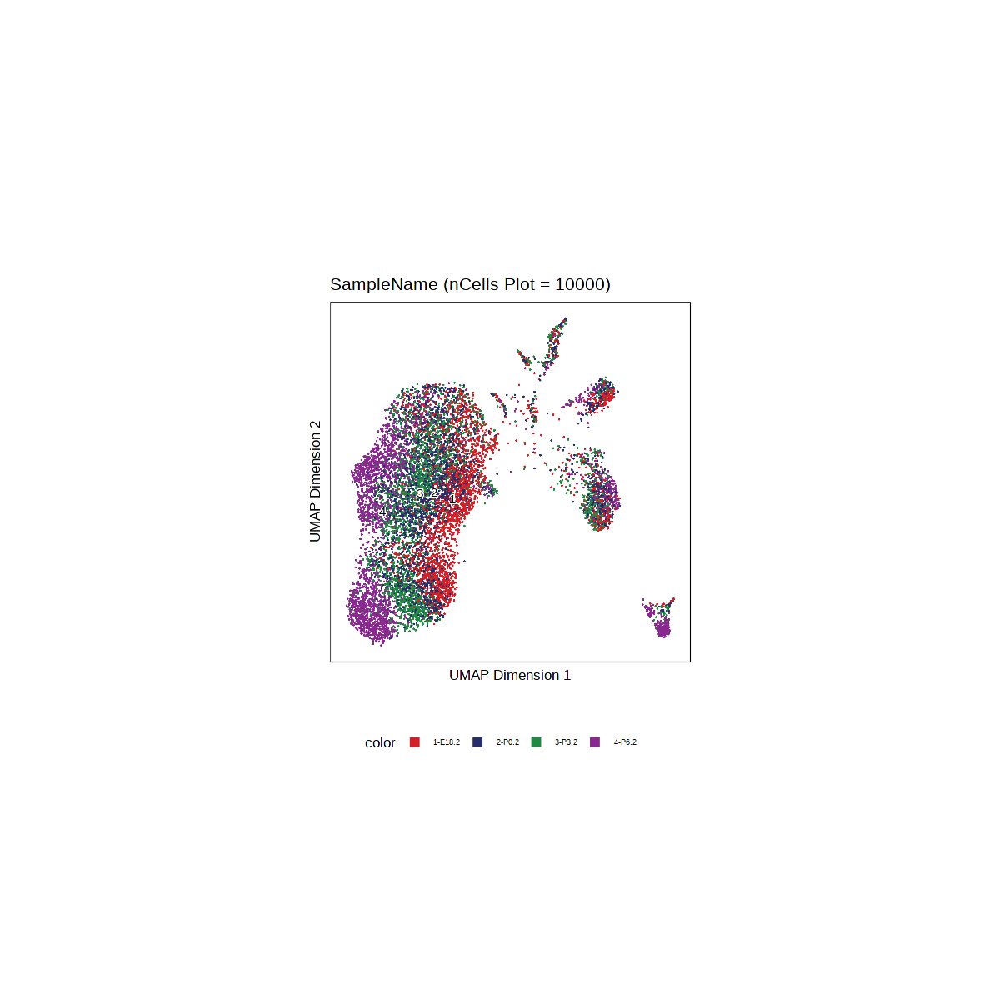

In [69]:
## Using Archr clustering method
Merged.proj2 <- addIterativeLSI(
    ArchRProj = Merged.proj2,
    useMatrix = "TileMatrix", 
    name = "IterativeLSI", 
    iterations = 3, 
    clusterParams = list( #See Seurat::FindClusters
        resolution = c(1.5), 
        sampleCells = 10000, 
        n.start = 10,
        algorithm=2
    ), 
    varFeatures = 200000, 
    dimsToUse = 1:30,
    force = TRUE
)


# plotEmbedding(ArchRProj = Merged.proj2,embedding = "UMAP", colorBy ="cellColData", name = c("Sample","Clusters"), size =0.2)

In [70]:
Merged.proj2 <- addUMAP(
    ArchRProj = Merged.proj2, 
    reducedDims = "IterativeLSI", 
    name = "UMAP", 
    nNeighbors = 40, 
    minDist = 0.4, 
    metric = "cosine",
    force = TRUE
)
Merged.proj2 <- addClusters(
    input = Merged.proj2,
    reducedDims = "IterativeLSI",
    method = "Seurat",
    name = "Clusters",
    resolution = 0.3,
    force= TRUE
)

23:57:40 UMAP embedding parameters a = 0.7669 b = 1.223

23:57:40 Read 25613 rows and found 30 numeric columns

23:57:40 Using Annoy for neighbor search, n_neighbors = 40

23:57:40 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

23:57:44 Writing NN index file to temp file /tmp/Rtmpkjon84/file742baa4436a

23:57:44 Searching Annoy index using 12 threads, search_k = 4000

23:57:45 Annoy recall = 100%

23:57:46 Commencing smooth kNN distance calibration using 12 threads

23:57:48 Initializing from normalized Laplacian + noise

23:57:49 Commencing optimization for 200 epochs, with 1482048 positive edges

23:58:01 Optimization finished

ArchR logging to : ArchRLogs/ArchR-addClusters-742b6fbe93f1-Date-2020-10-09_Time-23-58-03.log
If there is an issue, please report to github

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 25613
Number of edges: 814072

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9058
Number of communities: 13
Elapsed time: 4 seconds


2020-10-09 23:59:01 : Testing Biased Clusters, 0.953 mins elapsed.

2020-10-09 23:59:01 : Testing Outlier Clusters, 0.954 mins elapsed.

2020-10-09 23:59:01 : Assigning Cluster Names to 13 Clusters, 0.954 mins elapsed.

2020-10-09 23:59:01 : Finished addClusters, 0.955 mins elapsed.



In [41]:
Merged.proj2 <- addClusters(
    input = Merged.proj2,
    reducedDims = "IterativeLSI",
    method = "Seurat",
    name = "Clusters",
    resolution = 0.25,
    force= TRUE
)

ArchR logging to : ArchRLogs/ArchR-addClusters-4ed25088b928-Date-2020-10-21_Time-11-23-45.log
If there is an issue, please report to github with logFile!

Overriding previous entry for Clusters

2020-10-21 11:23:46 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.002 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 25613
Number of edges: 814072

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9126
Number of communities: 9
Elapsed time: 4 seconds


2020-10-21 11:24:44 : Testing Biased Clusters, 0.96 mins elapsed.

2020-10-21 11:24:44 : Testing Outlier Clusters, 0.961 mins elapsed.

2020-10-21 11:24:44 : Assigning Cluster Names to 9 Clusters, 0.961 mins elapsed.

2020-10-21 11:24:44 : Finished addClusters, 0.962 mins elapsed.



In [402]:
pdf(file="allcell.wo.harmony.UMAP.pdf")
# plotEmbedding(ArchRProj = Merged.proj2,embedding = "UMAP", colorBy ="cellColData", 
#               name = c("Sample","Clusters","TSSEnrichment","nFrags","FRIP"),
#               keepAxis = FALSE,
#               plotAs = "points",
#                  quantCut = c(0.0, 1),
# #               size=0.5,
#        baseSize = 20)
plotEmbedding(ArchRProj = Merged.proj2,embedding = "UMAP", colorBy ="cellColData", 
              name = c("Sample","Clusters"),
              keepAxis = FALSE,
              plotAs = "points",
                 quantCut = c(0.0, 1),
#               size=0.5,
       baseSize = 20)
dev.off()
plotEmbedding(ArchRProj = Merged.proj2,embedding = "UMAP", colorBy ="cellColData", 
              name = c("TSSEnrichment","nFrags","FRIP"),
              keepAxis = FALSE,
              plotAs = "points",
                 quantCut = c(0.0, 1),
#               size=0.5,
       baseSize = 20)


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fbcd47930-Date-2020-11-20_Time-12-00-43.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fbcd47930-Date-2020-11-20_Time-12-00-43.log



$Sample

$Clusters


pdf 
  3

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb43bf9ae8-Date-2020-11-20_Time-12-00-46.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb43bf9ae8-Date-2020-11-20_Time-12-00-46.log



$TSSEnrichment

$nFrags

$FRIP


In [408]:
# pdf(file="allcell.wo.harmony.UMAP.pdf")
p <- plotEmbedding(ArchRProj = Merged.proj2,embedding = "UMAP", colorBy ="cellColData", 
              name = c("Sample","Clusters"),
              keepAxis = FALSE,
              plotAs = "points",
                 quantCut = c(0.0, 1),
#               size=0.5,
       baseSize = 20)
plotPDF(p, "allcell.wo.harmony.UMAP.pdf", width = 5, height = 5)
# dev.off()

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb3e52b8ad-Date-2020-11-20_Time-12-09-28.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb3e52b8ad-Date-2020-11-20_Time-12-09-28.log

Plotting Ggplot!

Plotting Ggplot!

Plotting Other



[1] "allcell.wo.harmony.UMAP.pdf"


In [409]:
qc.umap.plot <- plotEmbedding(ArchRProj = Merged.proj2,embedding = "UMAP", colorBy ="cellColData", 
              name = c("TSSEnrichment","nFrags","FRIP"),
              keepAxis = FALSE,
              plotAs = "points",
                 quantCut = c(0.01, 0.99),
#               size=0.5,
       baseSize = 20)
plotPDF(qc.umap.plot, "allcell.wo.harmony.UMAP.QC.pdf", width = 5, height = 5)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb3a872741-Date-2020-11-20_Time-12-10-55.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb3a872741-Date-2020-11-20_Time-12-10-55.log

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Other



[1] "allcell.wo.harmony.UMAP.QC.pdf"


In [26]:
## Plot cell proportaion

cell.perc <- data.frame(table(Merged.proj2@cellColData$predictedGroup_Co, group.by = Merged.proj2@cellColData$Sample)) 

pdf("archr_4samples_allcell_perc.pdf",width=5,height=6.5)

ggbarplot(cell.perc,y="Freq", x="group.by",fill = "Var1",
                  # change fill color by mpg_level
#           order = c("CTRL","G9a"),
          color = "white",            # Set bar border colors to white
          palette = "aaas",
          position = position_fill() ,# jco journal color palett. see ?ggpar
#           sort.val = "desc",          # Sort the value in descending order
          sort.by.groups = FALSE,     # Don't sort inside each group
#           x.text.angle = 90,          # Rotate vertically x axis texts
          xlab = "Time point",
          ylab = "Percentage %",
          legend.title = "Cell type",
          lab.size = 25,
          rotate = FALSE,
          ggtheme = theme_minimal()
          ) 
NULL
dev.off()

NULL

png 
  2

In [398]:
## QC plot
p1 <- plotFragmentSizes(ArchRProj = Merged.proj2)
p2 <- plotTSSEnrichment(ArchRProj = Merged.proj2)
p3 <- plotGroups(
    ArchRProj = Merged.proj2, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "TSSEnrichment",
    plotAs = "ridges"
   )
p4 <- plotGroups(
    ArchRProj = Merged.proj2, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "TSSEnrichment",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )
p5 <- plotGroups(
    ArchRProj = Merged.proj2, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "log10(nFrags)",
    plotAs = "ridges"
   )
p6 <- plotGroups(
    ArchRProj = Merged.proj2, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "log10(nFrags)",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )
pdf(file="allcell.libraryQC.pdf",width=5,height=5)
p1
p2
p3
p4
p5
p6
dev.off()

ArchR logging to : ArchRLogs/ArchR-plotFragmentSizes-21fb19f1dbeb-Date-2020-11-20_Time-11-39-07.log
If there is an issue, please report to github with logFile!

2020-11-20 11:39:07 : P3.2 Computing FragmentSizes (1 of 4)!, 0.002 mins elapsed.

2020-11-20 11:39:11 : P3.2 Finished Computing FragmentSizes (1 of 4)!, 0.061 mins elapsed.

2020-11-20 11:39:11 : E18.2 Computing FragmentSizes (2 of 4)!, 0.062 mins elapsed.

2020-11-20 11:39:14 : E18.2 Finished Computing FragmentSizes (2 of 4)!, 0.115 mins elapsed.

2020-11-20 11:39:14 : P6.2 Computing FragmentSizes (3 of 4)!, 0.115 mins elapsed.

2020-11-20 11:39:17 : P6.2 Finished Computing FragmentSizes (3 of 4)!, 0.164 mins elapsed.

2020-11-20 11:39:17 : P0.2 Computing FragmentSizes (4 of 4)!, 0.164 mins elapsed.

2020-11-20 11:39:20 : P0.2 Finished Computing FragmentSizes (4 of 4)!, 0.217 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotFragmentSizes-21fb19f1dbeb-Date-2020-11-20_Time-11-39-07.log

ArchR logging to : ArchRL

png 
  2

# 3. Harmony integration

In [8]:
Merged.proj2 <- addHarmony(
    ArchRProj = Merged.proj2,
    reducedDims = "IterativeLSI",
    name = "Harmony",
    groupBy = "Sample"
)
Merged.proj2 <- addUMAP(
    ArchRProj = Merged.proj2, 
    reducedDims = "Harmony", 
    name = "UMAPHarmony", 
    nNeighbors = 30, 
    minDist = 0.5, 
    metric = "cosine")
Merged.proj2 <- addClusters(
    input = Merged.proj2,
    reducedDims = "Harmony",
    method = "Seurat",
    name = "Harmony.Clusters",
    resolution = 0.3,
    force= TRUE
)
p3 <- plotEmbedding(ArchRProj = Merged.proj2, colorBy = "cellColData", name = c("Sample","Clusters","DoubletEnrichment"), embedding = "UMAPHarmony")

22:20:58 UMAP embedding parameters a = 0.583 b = 1.334

22:20:58 Read 25613 rows and found 30 numeric columns

22:20:58 Using Annoy for neighbor search, n_neighbors = 30

22:20:58 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

22:21:01 Writing NN index file to temp file /tmp/RtmpZi43jP/file55ab4588a7af

22:21:01 Searching Annoy index using 12 threads, search_k = 3000

22:21:02 Annoy recall = 100%

22:21:03 Commencing smooth kNN distance calibration using 12 threads

22:21:04 Initializing from normalized Laplacian + noise

22:21:05 Commencing optimization for 200 epochs, with 1129672 positive edges

22:21:16 Optimization finished

22:21:16 Creating temp model dir /tmp/RtmpZi43jP/dir55ab4d2791f0

22:21:16 Creating dir /tmp/RtmpZi43jP/dir55ab4d2791f0

22:21:17 Changing t

01:35:40 UMAP embedding parameters a = 0.583 b = 1.334

01:35:40 Read 25613 rows and found 30 numeric columns

01:35:40 Using Annoy for neighbor search, n_neighbors = 30

01:35:40 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

01:35:43 Writing NN index file to temp file /tmp/RtmpPXKdIJ/file5e3f5c7e7799

01:35:43 Searching Annoy index using 12 threads, search_k = 3000

01:35:44 Annoy recall = 100%

01:35:45 Commencing smooth kNN distance calibration using 12 threads

01:35:46 Initializing from normalized Laplacian + noise

01:35:47 Commencing optimization for 200 epochs, with 1129672 positive edges

01:35:58 Optimization finished

01:35:58 Creating temp model dir /tmp/RtmpPXKdIJ/dir5e3f26fa8ad3

01:35:58 Creating dir /tmp/RtmpPXKdIJ/dir5e3f26fa8ad3

01:35:59 Changing t

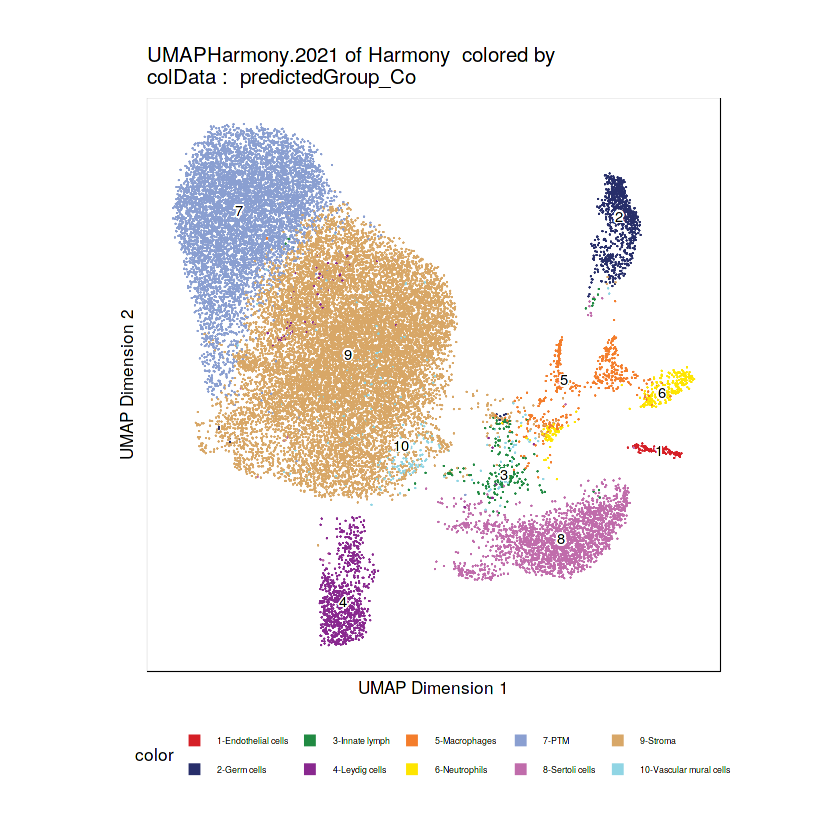

In [13]:
Merged.proj2 <- addUMAP(
    ArchRProj = Merged.proj2, 
    reducedDims = "Harmony", 
    name = "UMAPHarmony.2021", 
    nNeighbors = 30, 
    minDist = 0.5, 
    metric = "cosine",
force = TRUE)
plotEmbedding(ArchRProj = Merged.proj2, colorBy = "cellColData", name = c("predictedGroup_Co"), embedding = "UMAPHarmony.2021")

In [46]:
Merged.proj2 <- addClusters(
    input = Merged.proj2,
    reducedDims = "Harmony",
    method = "Seurat",
    name = "Harmony.Clusters",
    resolution = 0.3,
    force= TRUE
)

ArchR logging to : ArchRLogs/ArchR-addClusters-4ed2e9c108d-Date-2020-10-21_Time-11-30-04.log
If there is an issue, please report to github with logFile!

Overriding previous entry for Harmony.Clusters

2020-10-21 11:30:05 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.001 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 25613
Number of edges: 791939

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9051
Number of communities: 11
Elapsed time: 4 seconds


2020-10-21 11:31:03 : Testing Biased Clusters, 0.974 mins elapsed.

2020-10-21 11:31:03 : Testing Outlier Clusters, 0.975 mins elapsed.

2020-10-21 11:31:03 : Assigning Cluster Names to 11 Clusters, 0.975 mins elapsed.

2020-10-21 11:31:03 : Finished addClusters, 0.976 mins elapsed.



In [4]:
# pdf(file="allcell.harmonyumap.pdf",height=10,width=10)
plotEmbedding(ArchRProj = Merged.proj2, colorBy = "cellColData", name = c("Sample","Harmony.Clusters","DoubletEnrichment"), 
              embedding = "UMAPHarmony.2021",
             keepAxis = FALSE,
              plotAs = "points",
                 quantCut = c(0.0, 1),
#               size=0.5,
       baseSize = 20)
# dev.off()

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-5e3f53b1d080-Date-2021-02-10_Time-01-15-47.log
If there is an issue, please report to github with logFile!

Warning message in FUN(X[[i]], ...):
"DESCRIPTION file of package 'uwot' is missing or broken"


ERROR: Error in x[["Version"]]: subscript out of bounds


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-742b1c5976d0-Date-2020-10-10_Time-00-00-55.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-742b1c5976d0-Date-2020-10-10_Time-00-00-55.log



$Clusters

$Harmony.Clusters


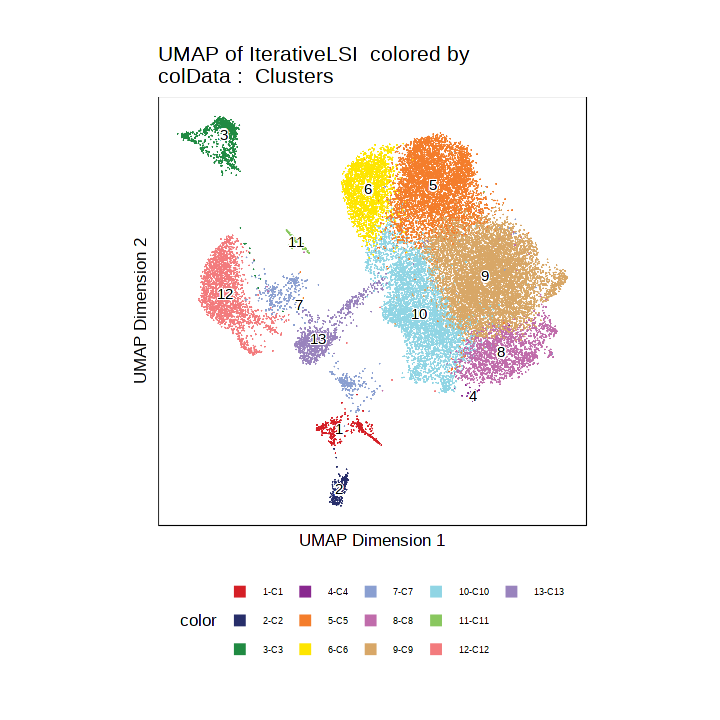

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-742b793cb121-Date-2020-10-10_Time-00-00-59.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-742b793cb121-Date-2020-10-10_Time-00-00-59.log



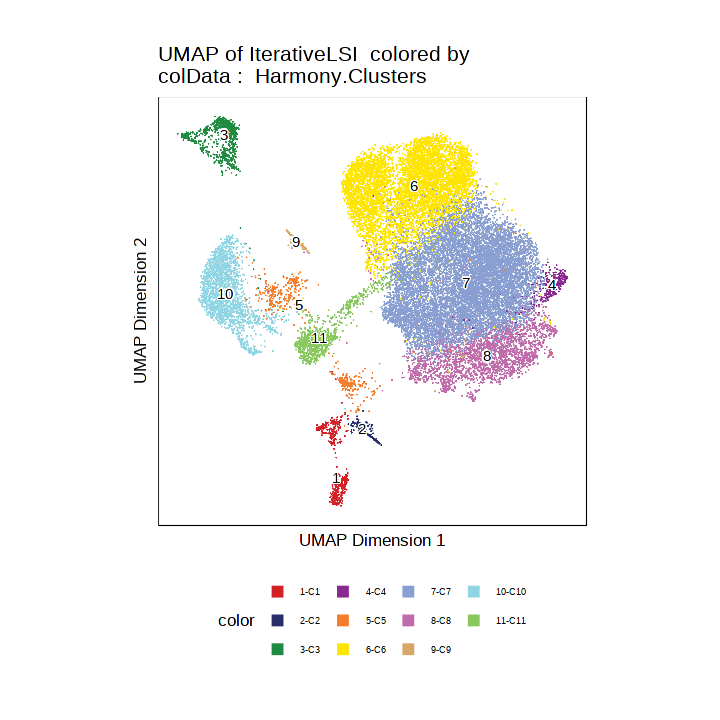

$Clusters

$Harmony.Clusters


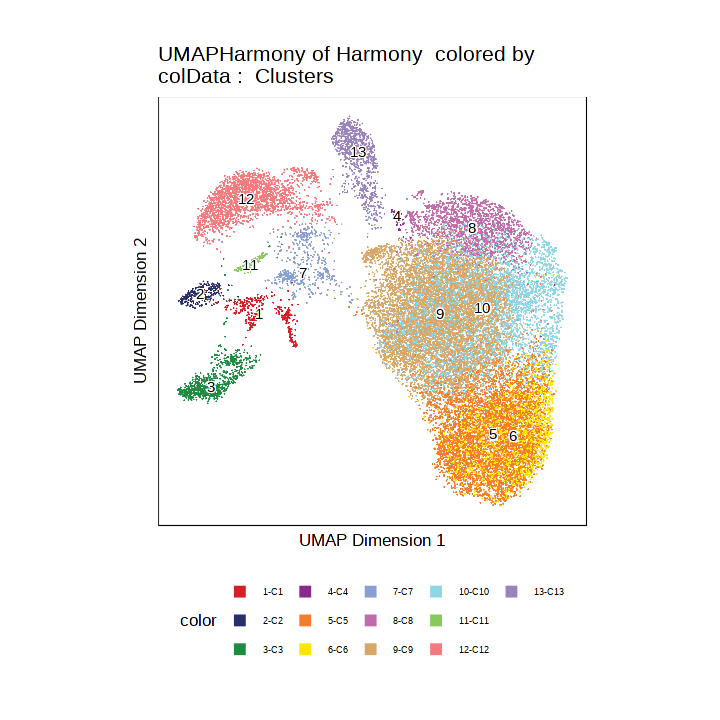

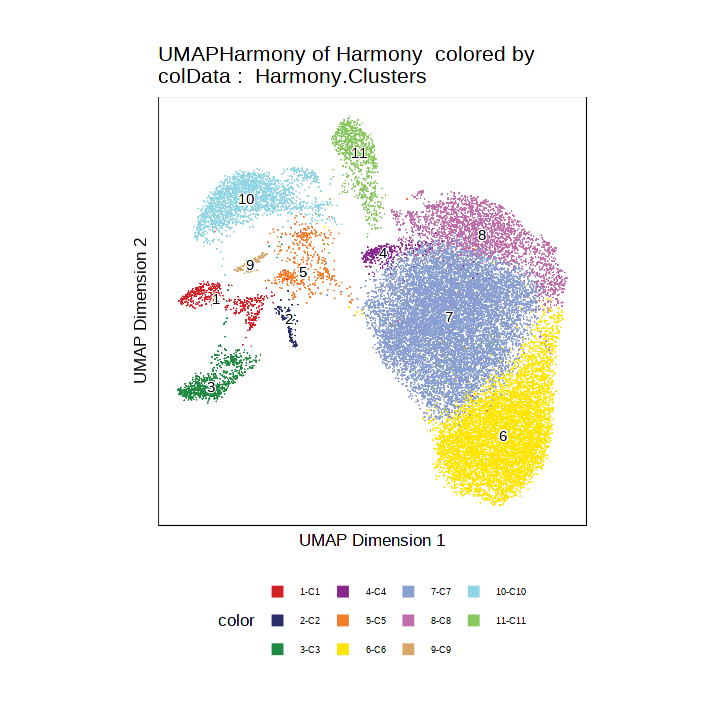

In [74]:
options(repr.plot.width=6,repr.plot.height=6)
plotEmbedding(ArchRProj = Merged.proj2, colorBy = "cellColData", name = c("Clusters","Harmony.Clusters"), embedding = "UMAP")
plotEmbedding(ArchRProj = Merged.proj2, colorBy = "cellColData", name = c("Clusters","Harmony.Clusters"), embedding = "UMAPHarmony")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-55ab6c02c44f-Date-2021-02-09_Time-22-38-49.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-55ab6c02c44f-Date-2021-02-09_Time-22-38-49.log



$Sample

$predictedGroup_Co


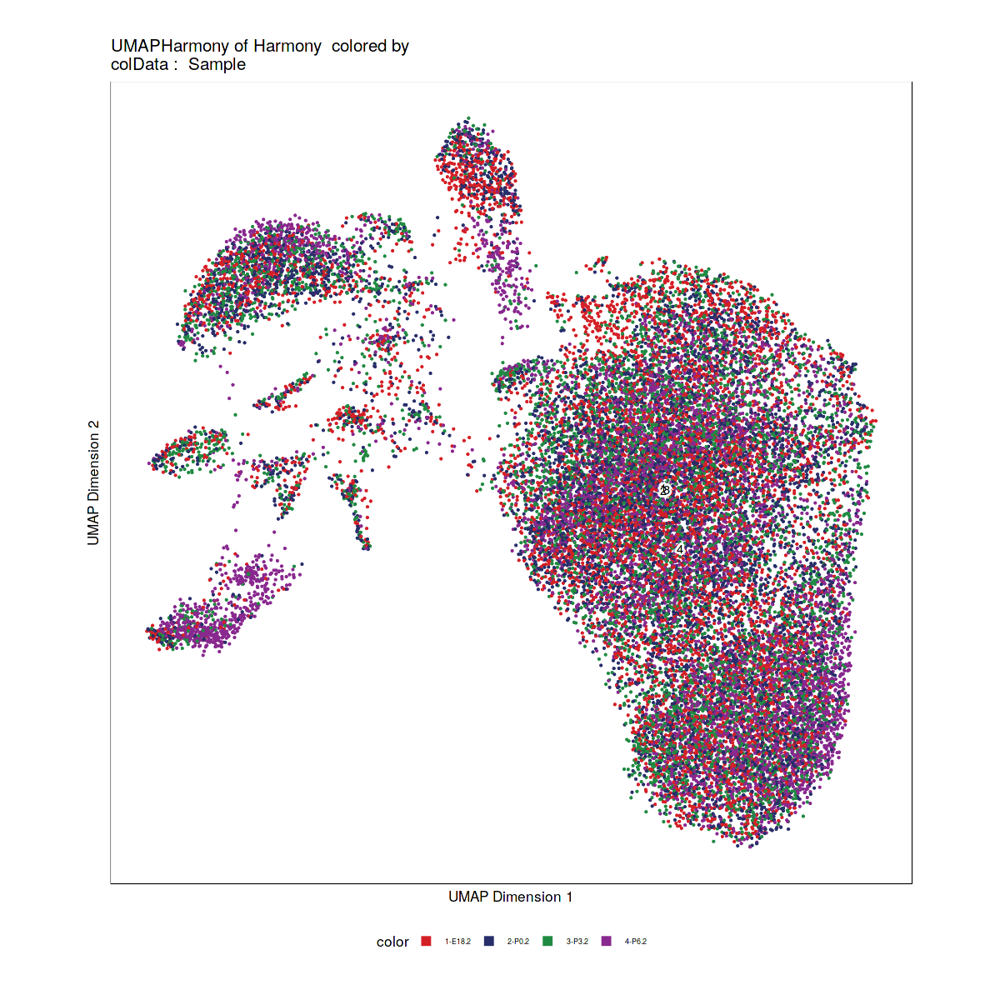

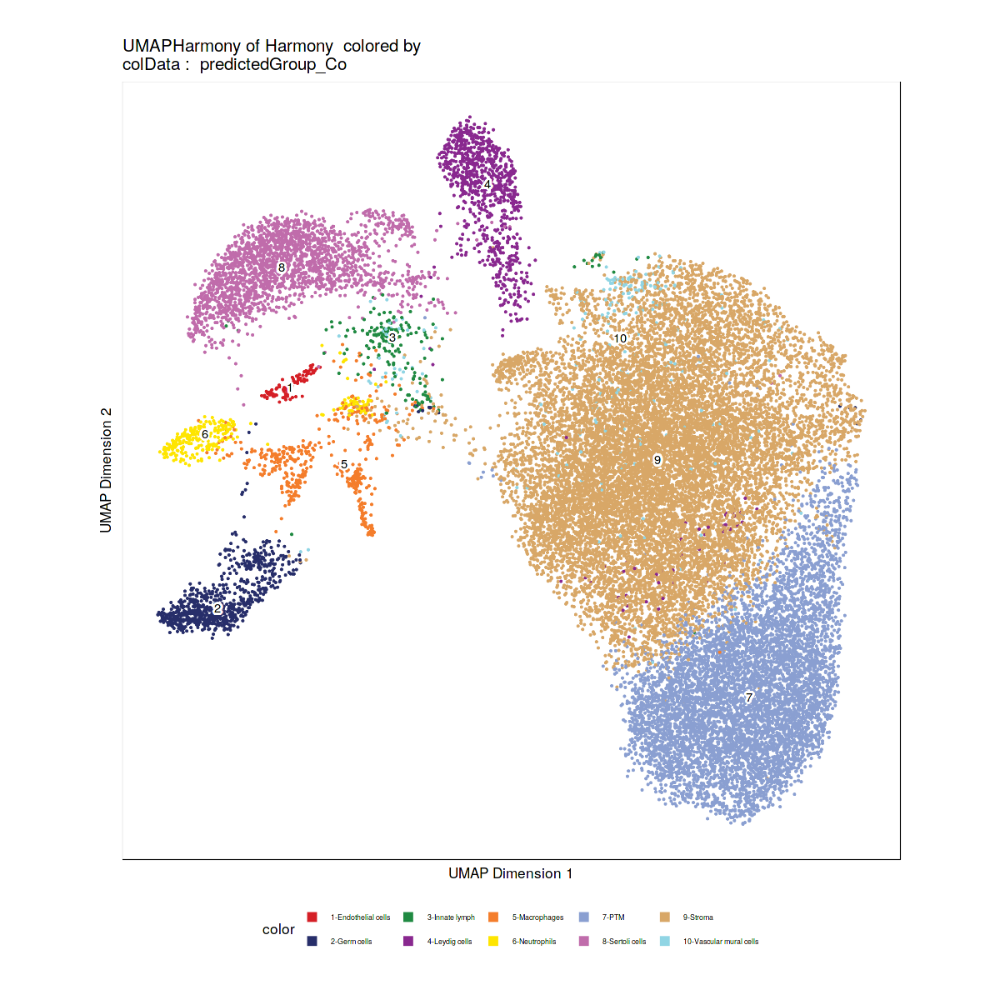

In [18]:
plotEmbedding(ArchRProj = Merged.proj2, colorBy = "cellColData", name = c("Sample","predictedGroup_Co"), embedding = "UMAPHarmony")

# 4. integrate with scRNA-seq data

In [46]:
seRNA <- readRDS("~/Gonocyte/testis.allcell.scRNAseq.rds")

In [39]:
# If merge blood cell
Idents(seRNA) <- seRNA@meta.data$celltype
seRNA <- RenameIdents(seRNA,"Neutrophils" = "Blood","Macrophages" = "Blood")
seRNA@meta.data$celltype2 <- Idents(seRNA)

In [40]:
markerGenes  <- c(
    "Dazl", # Germ cells
    "Amh", # SC
    "Cyp11a1", # Leydig cells
    "Acta2","Myh11", # PTM
    "Pecam1","Kdr", # Endothelial cells
    "Igf1","Inhba", # Stroma
    "Cd68","Cd52","Lyz2", # Macrophage
    "Ngp","Ltf",# neu
    "Cnmd","Bcam","Tbx1",# Innate lymph
    "Rgs5","Sept4","Pdgfrb","Cox4i2",# muscle
    "Fbxo47","Mbd3","Mex3c"
  )
umap.marker <- c("Dazl","Amh","Cyp11a1",# major cell types
                 "Pecam1",
#                  "Kdr",# Endothelial cells
                "Inhba",# Stroma
                 "Myh11",# PTM
#                  "Lyz2",
#                  "Cd52", #Macrophage
                 "Ngp",
                 "Cd7"
#                  "Ltf"# neu
              # "Pdgfrb","Cox4i2"
                )

In [41]:
table(seRNA@meta.data$celltype2)

Idents(seRNA) <- seRNA@meta.data$celltype
seRNA.fil <- subset(seRNA,idents = "Vascular mural cells", invert = TRUE)


               Blood Vascular mural cells           Germ cells 
                 199                  210                  637 
       Sertoli cells         Leydig cells               Stroma 
                9834                  478                 7519 
                 PTM    Endothelial cells         Innate lymph 
                2113                  320                   96 

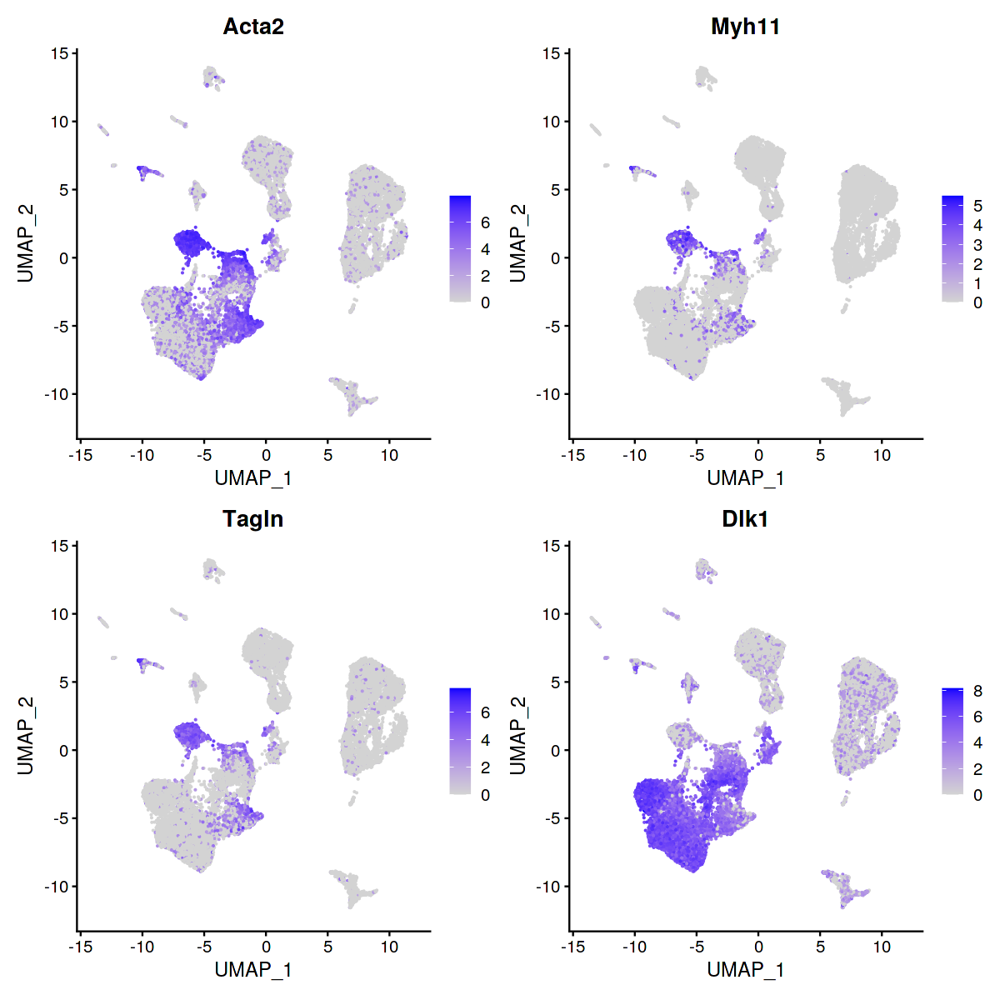

In [50]:
options(repr.plot.height=10,repr.plot.width=10)
FeaturePlot(seRNA, features = c("Acta2","Myh11","Tagln","Dlk1"),pt.size = 0.1)

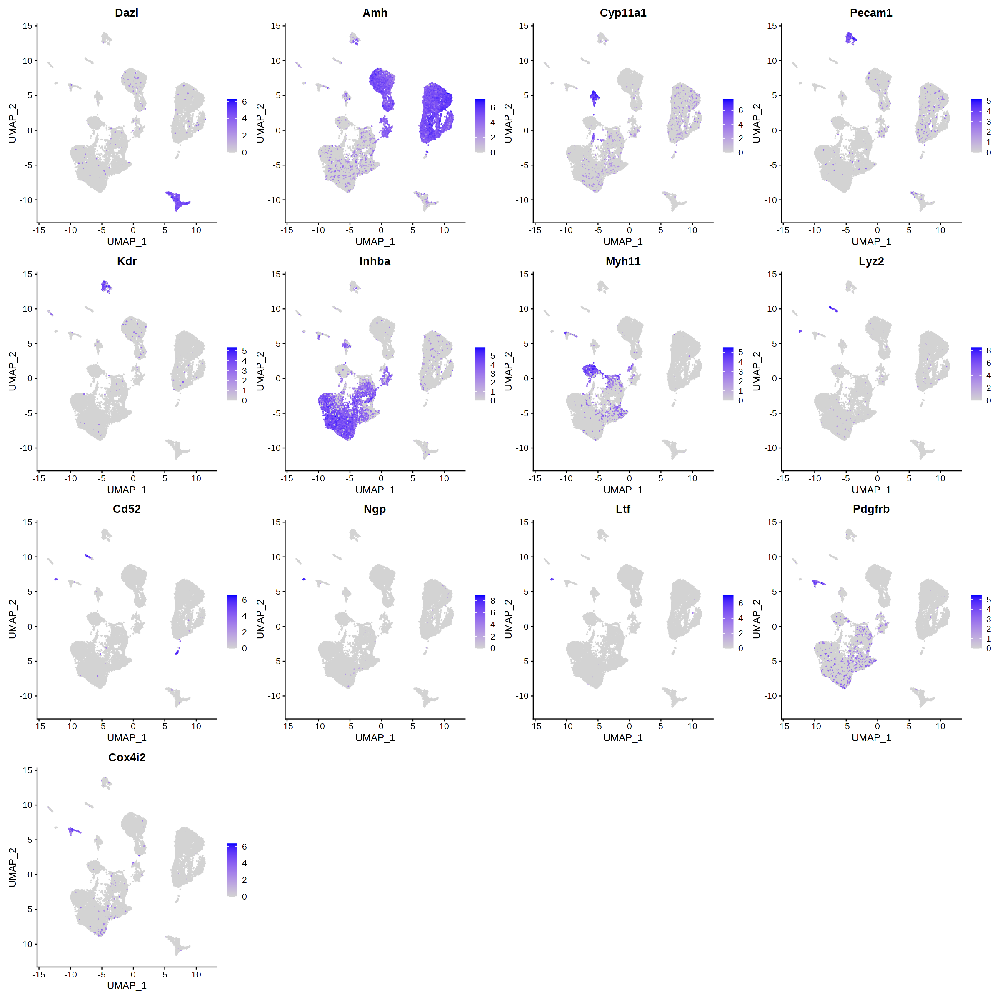

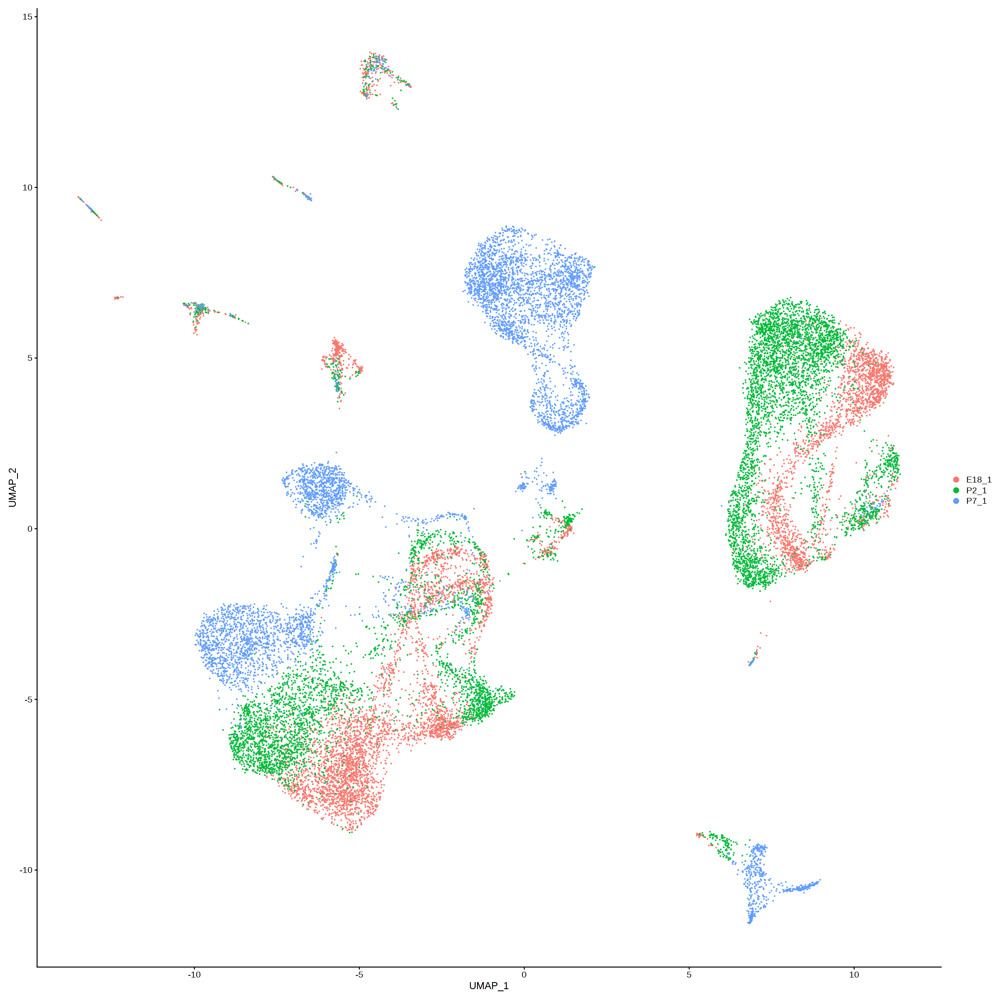

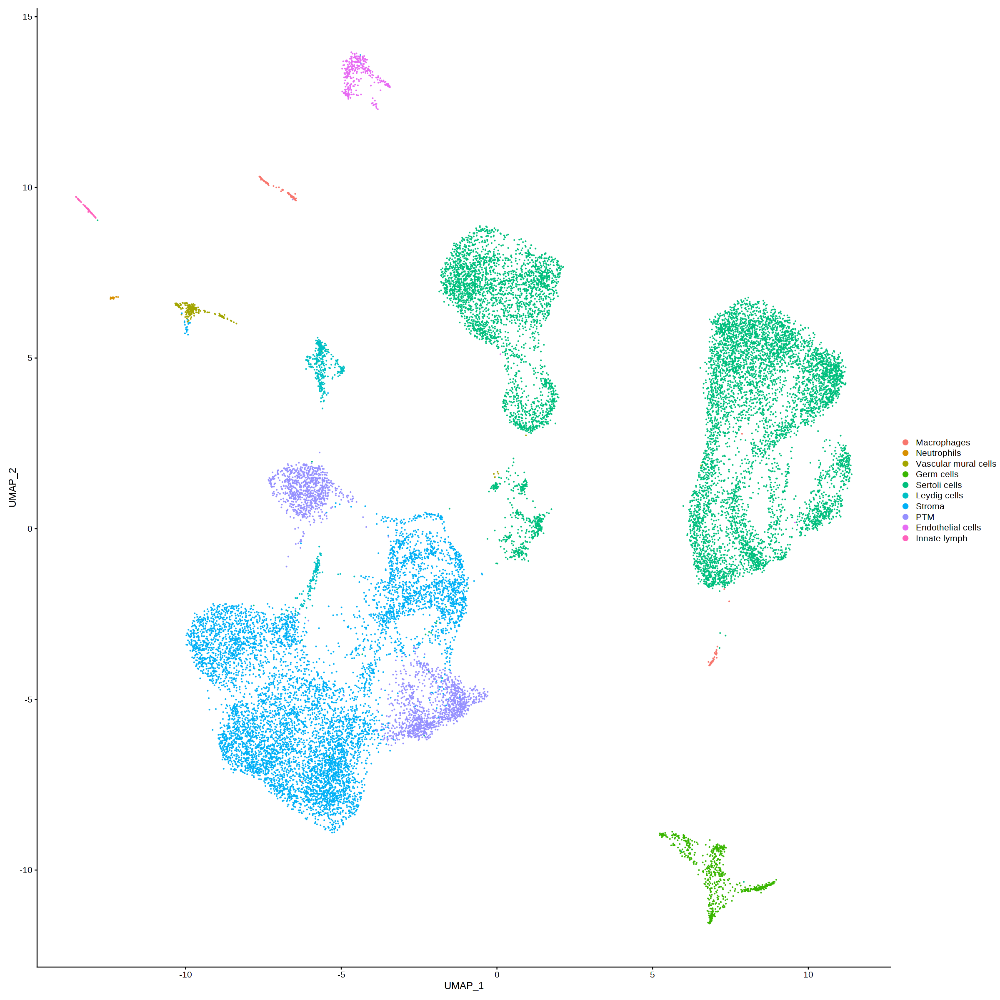

In [22]:
FeaturePlot(seRNA, features = umap.marker)
DimPlot(seRNA,group.by = "sample")
DimPlot(seRNA,group.by = "celltype")

In [42]:
## Get DEG for all cell type
scRNA.allcell.DEG.MAST <- FindAllMarkers(object = seRNA,test.use = "MAST", logfc.threshold = 0.25, only.pos= TRUE)

Calculating cluster Macrophages

Assuming data assay in position 1, with name et is log-transformed.


 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>--

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



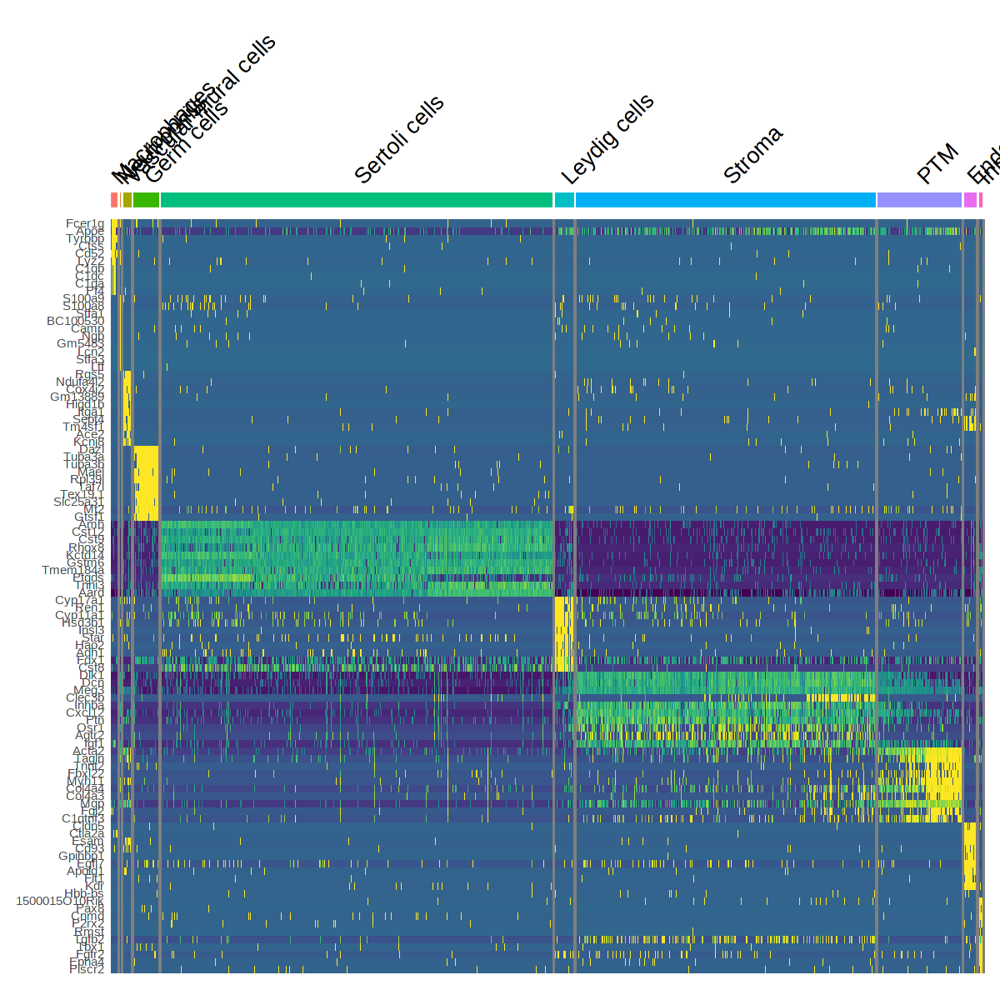

In [46]:
DefaultAssay(seRNA) <- "RNA"
top10 <- scRNA.allcell.DEG.MAST %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
# subset.integrated.nokit <- ScaleData(subset.integrated.nokit, verbose = FALSE)
DoHeatmap(seRNA, features = top10$gene,raster = FALSE) + NoLegend() + scale_fill_viridis(name="")
# DoHeatmap(seRNA, features = top10$gene,raster = FALSE) + NoLegend() 

In [393]:
write.csv(scRNA.allcell.DEG.MAST,"scRNA.allcell.DEG.MAST.csv")

In [7]:
## Integration without harmony 
Merged.proj2 <- addGeneIntegrationMatrix(
    ArchRProj = Merged.proj2, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = seRNA,
    addToArrow = TRUE,
    groupRNA = "celltype",
    nameCell = "predictedCell_Un_woharmony",
    nameGroup = "predictedGroup_Un_woharmony",
    nameScore = "predictedScore_Un_woharmony",
    force = TRUE
)

ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-4ed23bbd5e46-Date-2020-10-19_Time-11-39-44.log
If there is an issue, please report to github with logFile!

2020-10-19 11:39:44 : Running Seurat's Integration Stuart* et al 2019, 0.004 mins elapsed.

2020-10-19 11:39:45 : Checking ATAC Input, 0.015 mins elapsed.

2020-10-19 11:39:45 : Checking RNA Input, 0.015 mins elapsed.

2020-10-19 11:39:48 : Creating Integration Blocks, 0.069 mins elapsed.

2020-10-19 11:39:48 : Prepping Interation Data, 0.077 mins elapsed.

2020-10-19 11:39:49 : Computing Integration in 3 Integration Blocks!, 0 mins elapsed.

2020-10-19 11:39:49 : Block (1 of 3) : Computing Integration, 0 mins elapsed.

2020-10-19 11:39:52 : Block (1 of 3) : Identifying Variable Genes, 0.055 mins elapsed.

2020-10-19 11:39:57 : Block (1 of 3) : Getting GeneScoreMatrix, 0.13 mins elapsed.

2020-10-19 11:40:04 : Block (1 of 3) : Imputing GeneScoreMatrix, 0.252 mins elapsed.

Getting ImputeWeights

2020-10-19 11:40:36 : Blo

In [8]:
Merged.proj2 <- addGeneIntegrationMatrix(
    ArchRProj = Merged.proj2, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "Harmony",
    seRNA = seRNA,
    addToArrow = TRUE,
    groupRNA = "celltype",
    nameCell = "predictedCell_Un",
    nameGroup = "predictedGroup_Un",
    nameScore = "predictedScore_Un",
    force = TRUE
)


ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-3781c241ec8-Date-2020-10-14_Time-22-45-41.log
If there is an issue, please report to github with logFile!

2020-10-14 22:45:42 : Running Seurat's Integration Stuart* et al 2019, 0.005 mins elapsed.

2020-10-14 22:45:42 : Checking ATAC Input, 0.015 mins elapsed.

2020-10-14 22:45:42 : Checking RNA Input, 0.015 mins elapsed.

2020-10-14 22:45:46 : Creating Integration Blocks, 0.069 mins elapsed.

2020-10-14 22:45:46 : Prepping Interation Data, 0.077 mins elapsed.

2020-10-14 22:45:46 : Computing Integration in 3 Integration Blocks!, 0 mins elapsed.

2020-10-14 22:45:46 : Block (1 of 3) : Computing Integration, 0 mins elapsed.

2020-10-14 22:45:50 : Block (1 of 3) : Identifying Variable Genes, 0.067 mins elapsed.

2020-10-14 22:45:55 : Block (1 of 3) : Getting GeneScoreMatrix, 0.138 mins elapsed.

2020-10-14 22:46:02 : Block (1 of 3) : Imputing GeneScoreMatrix, 0.268 mins elapsed.

Getting ImputeWeights

2020-10-14 22:46:34 : Blo

Macrophages          Neutrophils Vascular mural cells 
           "#D51F26"            "#272E6A"            "#208A42" 
          Germ cells        Sertoli cells         Leydig cells 
           "#89288F"            "#F47D2B"            "#FEE500" 
              Stroma                  PTM    Endothelial cells 
           "#8A9FD1"            "#C06CAB"            "#D8A767" 
        Innate lymph 
           "#90D5E4"

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-37814d775a76-Date-2020-10-14_Time-23-11-58.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-37814d775a76-Date-2020-10-14_Time-23-11-58.log



$predictedGroup_Un

$Sample


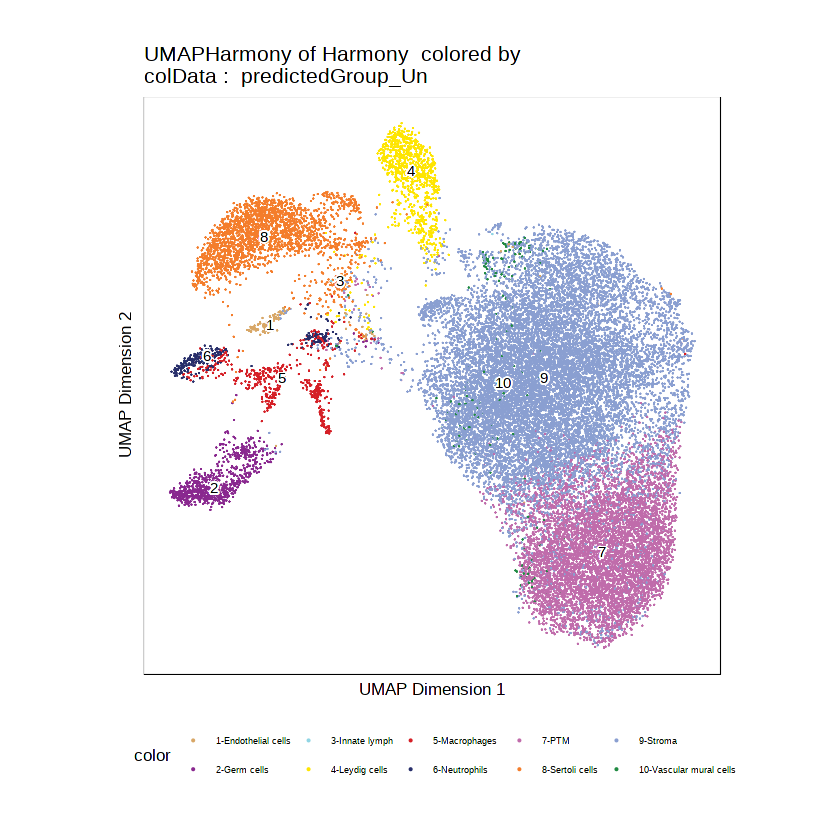

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3781233348-Date-2020-10-14_Time-23-12-01.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3781233348-Date-2020-10-14_Time-23-12-01.log



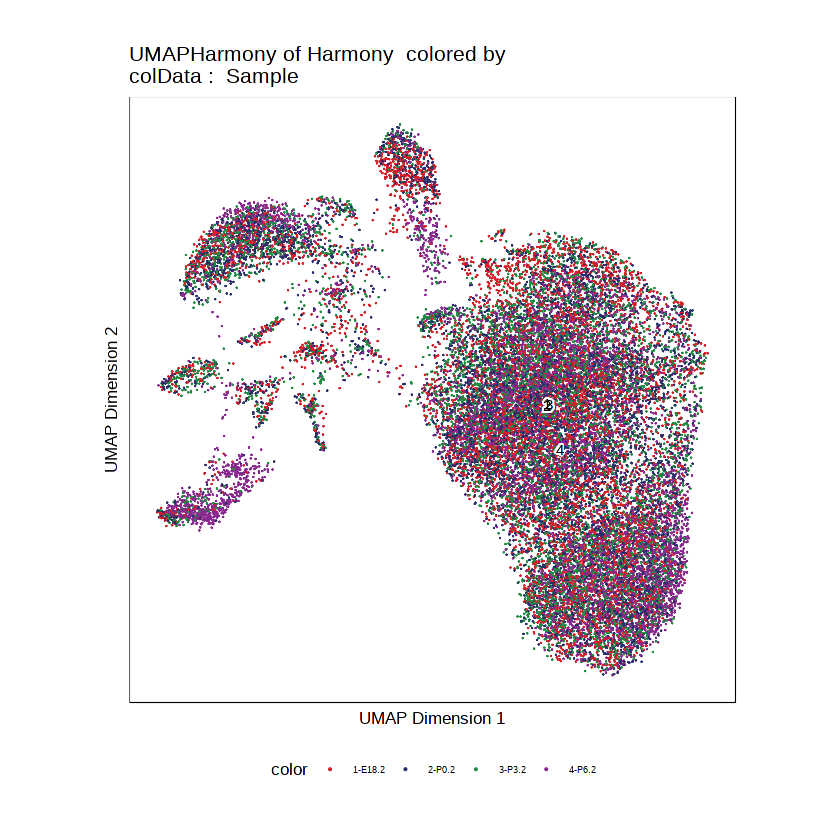

$predictedScore_Un

$Clusters


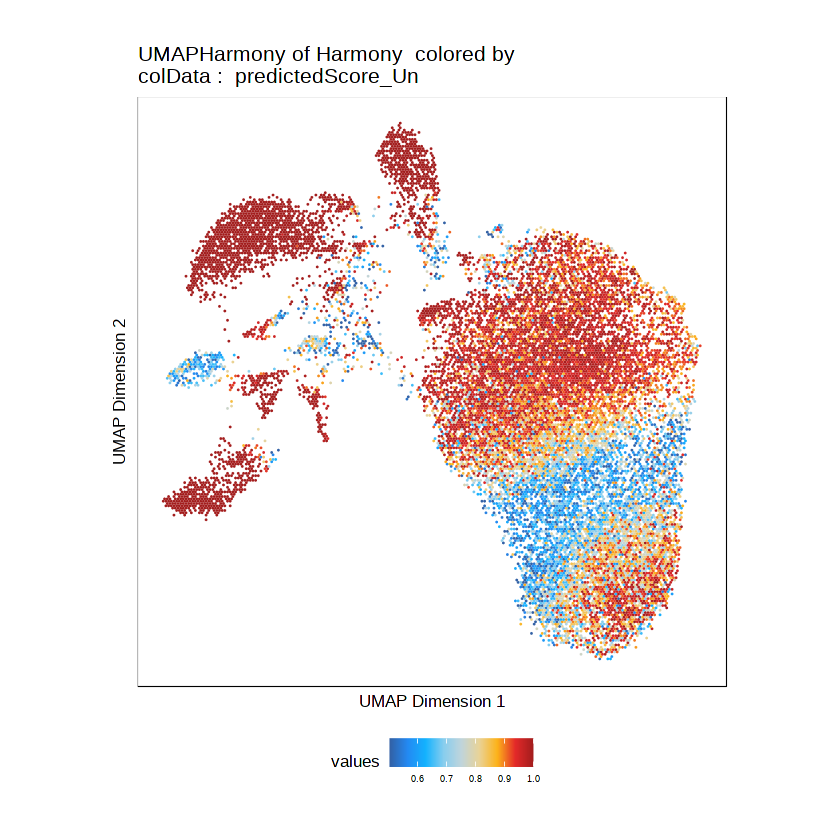

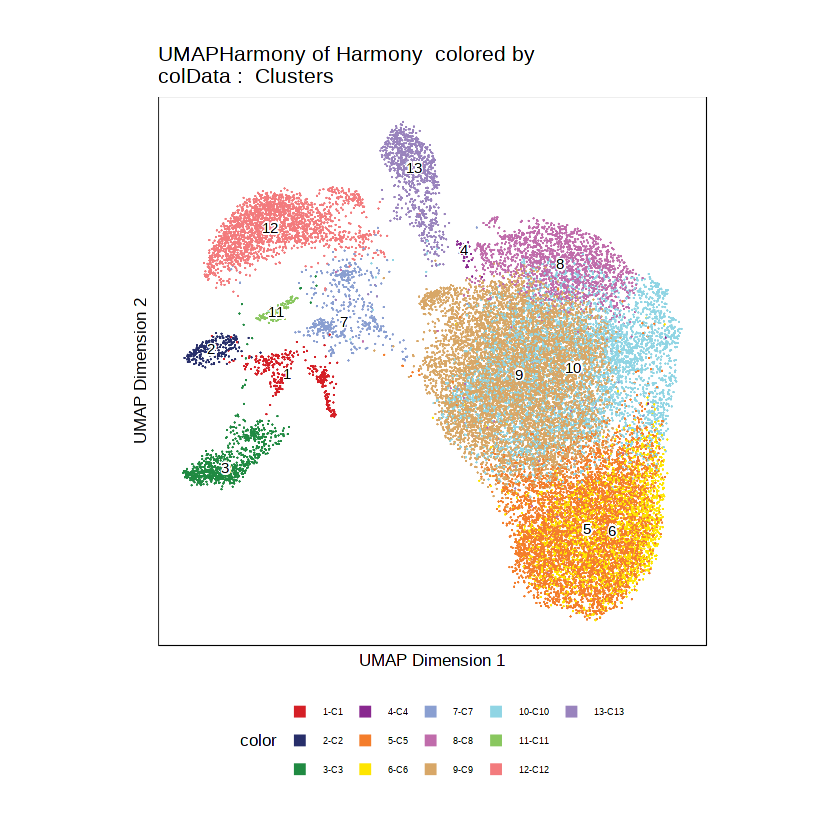

In [12]:
pal <- paletteDiscrete(values = seRNA$celltype)
pal
p1 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAPHarmony",
    colorBy = "cellColData",
    name = c("predictedGroup_Un","Sample"),
    pal = pal
)
p1
p2 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAPHarmony",
    colorBy = "cellColData",
    name = c("predictedScore_Un","Clusters"),
#     pal = pal
)
p2

#### Try constrained integration

In [13]:
# Using harmony.Clusters / No need to split time points
# Need to further constrain sertoli cells
groupList <- SimpleList(
 Sertoli = SimpleList(
        ATAC = Merged.proj2$cellNames[Merged.proj2$Harmony.Clusters %in% c("C10","C9","C11")]
,
        RNA = colnames(seRNA)[seRNA@meta.data$celltype %in% c("Sertoli cells","Endothelial cells","Leydig cells")]
    ),
     PTM = SimpleList(
        ATAC = Merged.proj2$cellNames[Merged.proj2$Harmony.Clusters %in% c("C6")]
,
        RNA = colnames(seRNA)[seRNA@meta.data$celltype %in% c("PTM")]
    ),

#     Endothelial = SimpleList(
#         ATAC = Merged.proj2$cellNames[Merged.proj2$Harmony.Clusters %in% c("C9")]
# ,
#         RNA = colnames(seRNA)[seRNA@meta.data$celltype %in% c("Endothelial cells")]
#     ),
#     Rest = SimpleList(
#         ATAC = Merged.proj2$cellNames[!(Merged.proj2$Harmony.Clusters %in% c("C9","C10","C11"))]
# ,
#         RNA = colnames(seRNA)[!seRNA@meta.data$celltype %in% c("Sertoli cells","Leydig cells","Endothelial cells")]
#     )
# )
       Rest = SimpleList(
        ATAC = Merged.proj2$cellNames[!(Merged.proj2$Harmony.Clusters %in% c("C10","C9","C6","C11"))]
,
        RNA = colnames(seRNA)[!seRNA@meta.data$celltype %in% c("Sertoli cells","Endothelial cells","PTM","Leydig cells")]
    )
)

In [15]:
Merged.proj2 <- addGeneIntegrationMatrix(
    ArchRProj = Merged.proj2, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = seRNA,
    addToArrow = FALSE,
    groupList = groupList,
    groupATAC = "Clusters",
    groupRNA = "celltype",
    nameCell = "predictedCell_Co",
    nameGroup = "predictedGroup_Co",
    nameScore = "predictedScore_Co",
    force = TRUE,
    
    nGenes = 2000,
)



ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-378136870b0c-Date-2020-10-14_Time-23-14-49.log
If there is an issue, please report to github with logFile!

2020-10-14 23:14:49 : Running Seurat's Integration Stuart* et al 2019, 0.01 mins elapsed.

2020-10-14 23:14:50 : Checking ATAC Input, 0.02 mins elapsed.

2020-10-14 23:14:50 : Checking RNA Input, 0.02 mins elapsed.

2020-10-14 23:14:53 : Creating Integration Blocks, 0.07 mins elapsed.

2020-10-14 23:14:53 : Prepping Interation Data, 0.072 mins elapsed.

2020-10-14 23:14:53 : Computing Integration in 4 Integration Blocks!, 0 mins elapsed.

2020-10-14 23:14:53 : Block (1 of 4) : Computing Integration, 0 mins elapsed.

2020-10-14 23:14:56 : Block (1 of 4) : Identifying Variable Genes, 0.039 mins elapsed.

2020-10-14 23:15:00 : Block (1 of 4) : Getting GeneScoreMatrix, 0.11 mins elapsed.

2020-10-14 23:15:04 : Block (1 of 4) : Imputing GeneScoreMatrix, 0.183 mins elapsed.

Getting ImputeWeights

2020-10-14 23:15:10 : Block (

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4ed2557fc4f2-Date-2020-10-23_Time-11-25-26.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4ed2557fc4f2-Date-2020-10-23_Time-11-25-26.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4ed271125a77-Date-2020-10-23_Time-11-25-28.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4ed271125a77-Date-2020-10-23_Time-11-25-28.log



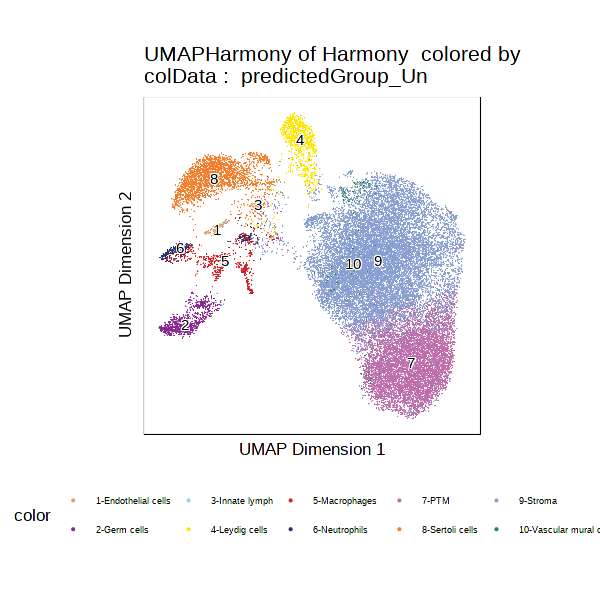

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4ed26d8736a4-Date-2020-10-23_Time-11-25-31.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4ed26d8736a4-Date-2020-10-23_Time-11-25-31.log



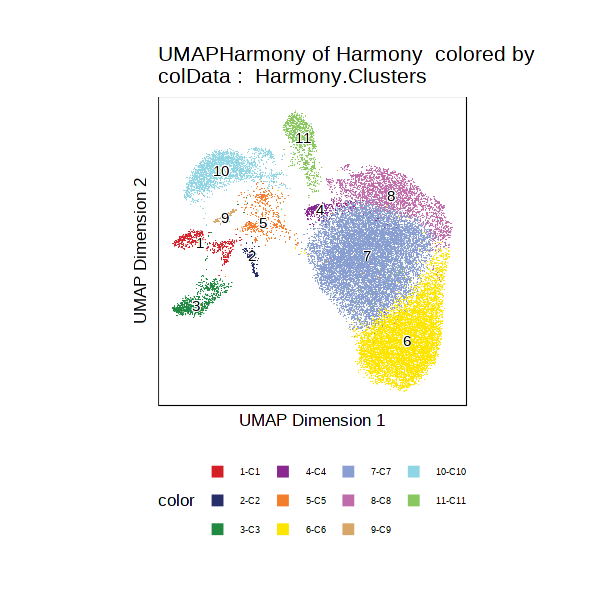

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4ed27ea12a5c-Date-2020-10-23_Time-11-25-34.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4ed27ea12a5c-Date-2020-10-23_Time-11-25-34.log



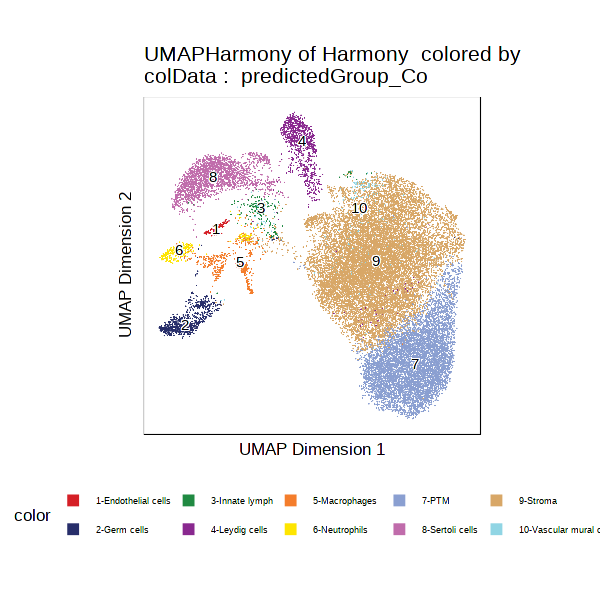

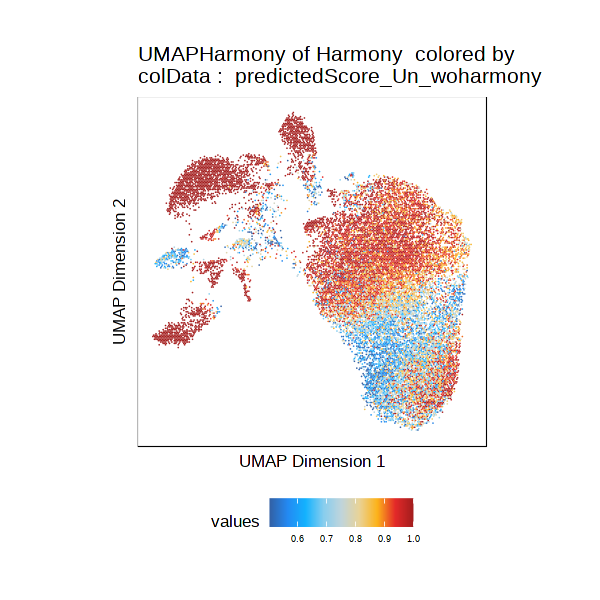

In [257]:
pal <- paletteDiscrete(values = seRNA$celltype)
p1 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAPHarmony",
    colorBy = "cellColData",
    name = "predictedGroup_Un", 
    pal = pal,
    baseSize = 10
)
p1
p2 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAPHarmony",
    colorBy = "cellColData",
    name = "Harmony.Clusters", 
#     pal = pal
)
p2

p4 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAPHarmony",
    colorBy = "cellColData",
    name = "predictedGroup_Co", 
#     pal = pal
)
p4

p4 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAPHarmony",
    colorBy = "cellColData",
    name = "predictedScore_Un_woharmony", 
#     pal = pal
)
p4

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4ed24b15f521-Date-2020-10-20_Time-10-25-40.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4ed24b15f521-Date-2020-10-20_Time-10-25-40.log



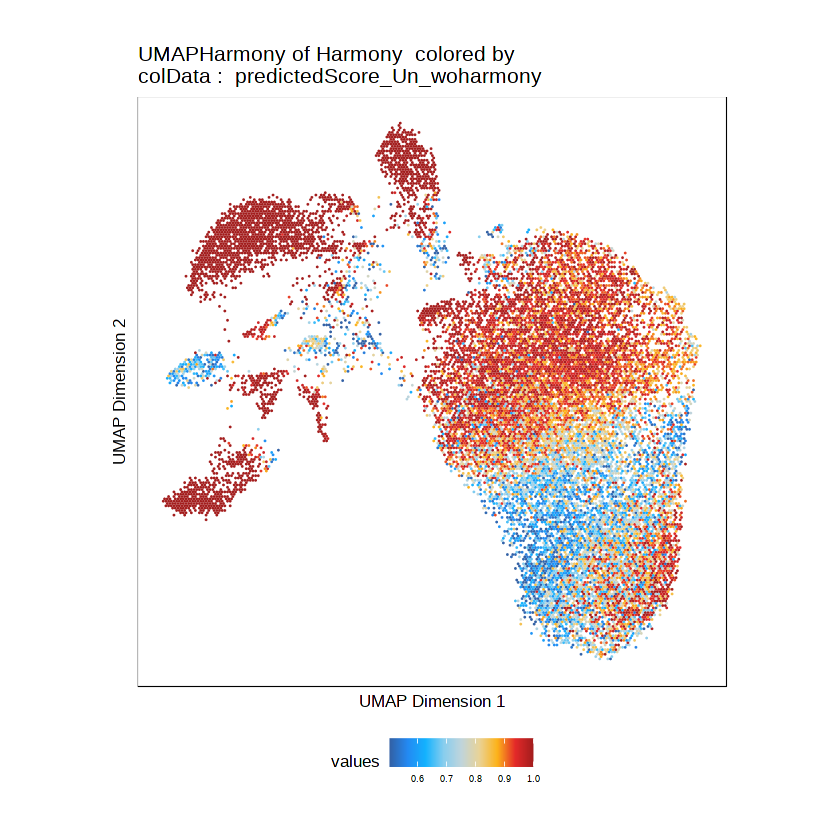

In [11]:
p4 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAPHarmony",
    colorBy = "cellColData",
    name = "predictedScore_Un_woharmony", 
#     pal = pal
)
p4

In [153]:
horizonExtra2 = c("1"='#000075',"4"='#2E00FF', "6"='#9408F7', "10"='#C729D6', "8"='#FA4AB5', "3"='#FF6A95', "7"='#FF8B74', "5"='#FFAC53', "9"='#FFCD32',"2"="#ffd94a")
horizonExtra2 <- colorRampPalette(horizonExtra2)(256)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb26ad55f6-Date-2020-10-31_Time-17-01-12.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2020-10-31 17:01:13 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb26ad55f6-Date-2020-10-31_Time-17-01-12.log



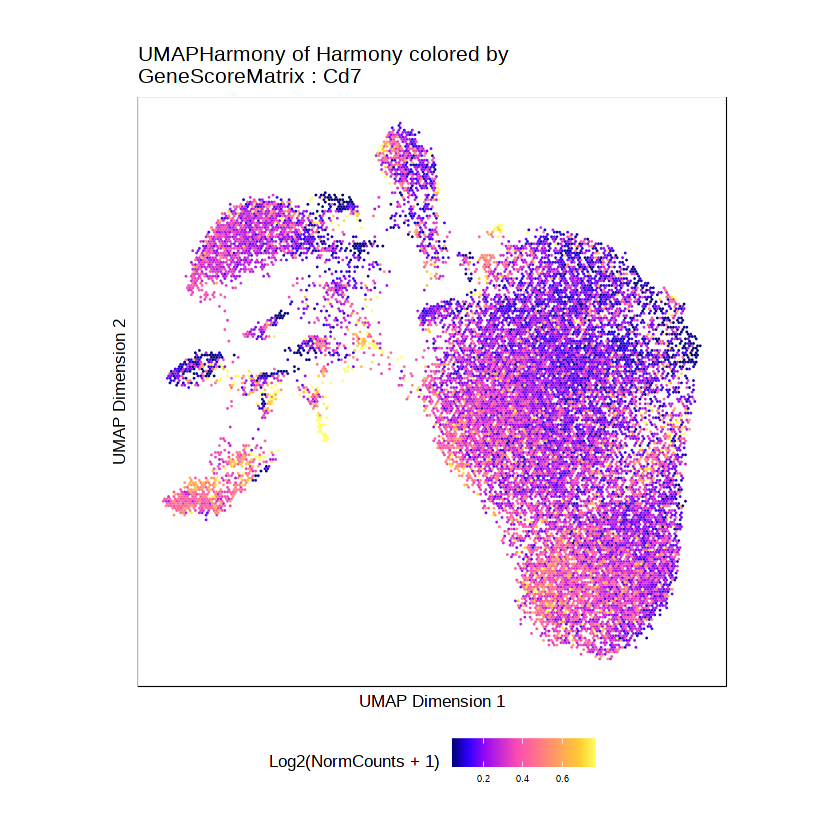

In [11]:
plotEmbedding(
    ArchRProj = Merged.proj2, 
    colorBy = "GeneScoreMatrix", 
#     name = markerGenes, 
    name = "Cd7", 
    embedding = "UMAPHarmony",
    size=2,
#     plotAs = "hex",
#    pal = horizonExtra2,
    continuousSet = "horizon",
    imputeWeights = getImputeWeights(Merged.proj2)
)

In [385]:
## Plot some marker gene in embedding
pdf(file="allcell.marker.GS.umap.v2.solarExtra.pdf")
p <- plotEmbedding(
    ArchRProj = Merged.proj2, 
    colorBy = "GeneScoreMatrix", 
#     name = markerGenes, 
    name = umap.marker, 
    embedding = "UMAPHarmony",
    size=2,
    plotAs = "hex",
#        continuousSet = "solarExtra",
    pal =horizonExtra2,
#     solarExtra
    imputeWeights = getImputeWeights(Merged.proj2)
)

p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0.2, 0.2, 0.2, 0.2), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
options(repr.plot.width=10,repr.plot.height=10)
do.call(cowplot::plot_grid, c(list(ncol = 4),p2))
dev.off()

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4ed261edf18-Date-2020-10-23_Time-23-52-13.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2020-10-23 23:52:13 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4ed261edf18-Date-2020-10-23_Time-23-52-13.log



png 
  2

In [384]:
horizonExtra2 = c("1"="#000436","4"="#021EA9","6"="#1632FB","8"="#6E34FC","3"="#C732D5","9"="#FD619D","7"="#FF9965","5"="#FFD32B","2"="#ffd94a")
horizonExtra2 <- colorRampPalette(horizonExtra2)(256)


In [387]:
pdf(file="allcell.GS.umap.scale.pdf")
plotEmbedding(
    ArchRProj = Merged.proj2, 
    colorBy = "GeneScoreMatrix", 
    name = "Gata4", 
    embedding = "UMAPHarmony",
    size=2,
    pal= horizonExtra2,
    imputeWeights = getImputeWeights(Merged.proj2)
)
dev.off()

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-4ed2699c7280-Date-2020-10-23_Time-23-58-27.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2020-10-23 23:58:27 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-4ed2699c7280-Date-2020-10-23_Time-23-58-27.log



png 
  2

# 5. Call peaks

In [158]:
pathToMacs2 <- findMacs2()
Merged.proj2 <- addGroupCoverages(ArchRProj = Merged.proj2, groupBy = "predictedGroup_Co",maxCells = 10000,
       force = TRUE)
Merged.proj2 <- addReproduciblePeakSet(
    ArchRProj = Merged.proj2, 
    maxPeaks = 200000,
    groupBy = "predictedGroup_Co", 
    pathToMacs2 = pathToMacs2,
    peaksPerCell = 10000,
       excludeChr = "chrM",
    force = TRUE 
)


Searching For MACS2..

Found with $path!

ArchR logging to : ArchRLogs/ArchR-addGroupCoverages-4ed2532356d8-Date-2020-10-21_Time-16-22-25.log
If there is an issue, please report to github with logFile!

Endothelial cells (1 of 10) : CellGroups N = 2

Germ cells (2 of 10) : CellGroups N = 4

Innate lymph (3 of 10) : CellGroups N = 3

Leydig cells (4 of 10) : CellGroups N = 4

Macrophages (5 of 10) : CellGroups N = 4

Neutrophils (6 of 10) : CellGroups N = 3

PTM (7 of 10) : CellGroups N = 4

Sertoli cells (8 of 10) : CellGroups N = 4

Stroma (9 of 10) : CellGroups N = 4

Vascular mural cells (10 of 10) : CellGroups N = 3

2020-10-21 16:22:26 : Creating Coverage Files!, 0.028 mins elapsed.

2020-10-21 16:22:26 : Batch Execution w/ safelapply!, 0.028 mins elapsed.

2020-10-21 16:22:26 : Group Endothelial cells._.Rep1 (1 of 35) : Creating Group Coverage File : Endothelial.cells._.Rep1.insertions.coverage.h5, 0.028 mins elapsed.

Number of Cells = 51

Coverage File Exists!

Added Coverage G

                                    Group nCells nCellsUsed nReplicates nMin
Endothelial cells       Endothelial cells    101        101           2   50
Germ cells                     Germ cells    780        780           4   73
Innate lymph                 Innate lymph    189        189           3   59
Leydig cells                 Leydig cells    921        921           4  111
Macrophages                   Macrophages    463        463           4   53
Neutrophils                   Neutrophils    290        287           3   69
PTM                                   PTM   6819       6819           4 1422
Sertoli cells               Sertoli cells   2118       2118           4  454
Stroma                             Stroma  13690      13690           4 3131
Vascular mural cells Vascular mural cells    242        242           3   42
                     nMax maxPeaks
Endothelial cells      51    2e+05
Germ cells            545    2e+05
Innate lymph           69    2e+05
Leydig cells 

2020-10-21 16:49:08 : Batching Peak Calls!, 0.013 mins elapsed.

2020-10-21 16:49:08 : Batch Execution w/ safelapply!, 0 mins elapsed.

2020-10-21 16:49:08 : Group 1 of 35, Calling Peaks with MACS2!, 0 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 1.87e+09 --name Endothelial.cells._.Rep1-1 --treatment /home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/InsertionBeds/Endothelial.cells._.Rep1-1.insertions.bed --outdir /home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/InsertionBeds --format BED --call-summits --keep-dup all --nomodel --nolambda --shift -75 --extsize 150 -q 0.1

2020-10-21 16:49:26 : Group 2 of 35, Calling Peaks with MACS2!, 0.298 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 1.87e+09 --name Endothelial.cells._.Rep2-2 --treatment /home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/InsertionBeds/Endothelial.cells._.Rep2-2.insertions.bed --outdir /home/leetl/Gonocyte/Raw_data

[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/Endothelial.cells-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/Germ.cells-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/Innate.lymph-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/Leydig.cells-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/Macrophages-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/Neutrophils-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/PTM-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/Sertoli.cells-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/Stroma-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/Gonocyte/Raw_data/Allcell.202009.wodoublet.filtering/PeakCalls/Vascular.mural.cells-reproduciblePeaks.gr.rds"


2020-10-21 17:22:37 : Creating Union Peak Set!, 33.484 mins elapsed.

Converged after 8 iterations!

Plotting Ggplot!

2020-10-21 17:22:40 : Finished Creating Union Peak Set (222919)!, 33.547 mins elapsed.



In [ ]:
Merged.proj2 <- addPeakMatrix(Merged.proj2)

ArchR logging to : ArchRLogs/ArchR-addPeakMatrix-4ed24b3a06dd-Date-2020-10-21_Time-17-22-40.log
If there is an issue, please report to github with logFile!

2020-10-21 17:22:41 : Batch Execution w/ safelapply!, 0 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2020-10-21 17:22:53 : Adding P3.2 to PeakMatrix for Chr (1 of 21)!, 0.01 mins elapsed.

2020-10-21 17:22:56 : Adding P3.2 to PeakMatrix for Chr (2 of 21)!, 0.063 mins elapsed.

2020-10-21 17:23:00 : Adding P3.2 to PeakMatrix for Chr (3 of 21)!, 0.123 mins elapsed.

2020-10-21 17:23:02 : Adding P3.2 to PeakMatrix for Chr (4 of 21)!, 0.171 mins elapsed.

2020-10-21 17:23:06 : Adding P3.2 to PeakMatrix for Chr (5 of 21)!, 0.226 mins e

In [8]:
getPeakSet(Merged.proj2)

GRanges object with 222919 ranges and 12 metadata columns:
               seqnames            ranges strand |     score
                  <Rle>         <IRanges>  <Rle> | <numeric>
        Stroma     chr1   3119429-3119929      * |   48.9258
           PTM     chr1   3120385-3120885      * |   2.71904
    Germ cells     chr1   3121660-3122160      * |   6.92519
  Leydig cells     chr1   3132004-3132504      * |   4.91958
    Germ cells     chr1   3184968-3185468      * |   14.2382
           ...      ...               ...    ... .       ...
    Germ cells     chrY   5892742-5893242      * |   3.78685
    Germ cells     chrY   5999843-6000343      * |   4.06964
    Germ cells     chrY   9836958-9837458      * |    6.3579
    Germ cells     chrY   9990110-9990610      * |   4.22458
    Germ cells     chrY 10635896-10636396      * |   6.92519
               replicateScoreQuantile groupScoreQuantile Reproducibility
                            <numeric>          <numeric>       <numeric>
  

In [ ]:
if("Motif" %ni% names(Merged.proj2@peakAnnotation)){
    Merged.proj2 <- addMotifAnnotations(ArchRProj = Merged.proj2, motifSet = "cisbp", name = "Motif")
}
Merged.proj2 <- addBgdPeaks(Merged.proj2)
Merged.proj2 <- addDeviationsMatrix(
  ArchRProj = Merged.proj2, 
  peakAnnotation = "Motif",
  force = TRUE
)

#  6. Inter cluster comparison

### 6.1 find marker gene (GS)

In [45]:
usegroups <- (Merged.proj2@cellColData$predictedGroup_Co %>% unique() %>% print())[2:10]

 [1] "Innate lymph"         "Sertoli cells"        "Germ cells"          
 [4] "Macrophages"          "PTM"                  "Stroma"              
 [7] "Neutrophils"          "Leydig cells"         "Vascular mural cells"
[10] "Endothelial cells"   


In [46]:
markersGS <- getMarkerFeatures(
    ArchRProj = Merged.proj2, 
    useMatrix = "GeneScoreMatrix", 
    maxCells = 5000,
    useGroups= usegroups,
    groupBy = "predictedGroup_Co",
    k=200,
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-5e3f2cc88acf-Date-2021-02-11_Time-00-48-15.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2021-02-11 00:48:15 : Matching Known Biases, 0.004 mins elapsed.

2021-02-11 00:48:24 : Computing Pairwise Tests (1 of 9), 0.153 mins elapsed.

Pairwise Test Sertoli cells : Seqnames chr1

Pairwise Test Sertoli cells : Seqnames chr10

Pairwise Test Sertoli cells : Seqnames chr11

Pairwise Test Sertoli cells : Seqnames chr12

Pairwise Test Sertoli cells : Seqnames chr13

Pairwise Test Sertoli cells : Seqnames chr14

Pairwise Test Sertoli cells : Seqnames chr15

Pairwise Test Sertoli cells : Seqnames chr16

Pairwise Test Sertoli cells : Seqnames chr17

Pairwise Test Sertoli cells : Seqnames chr18

Pairwise Test Sertoli cells : Seqnames chr19

Pairwise Test Sertoli cells : Seqnames chr2

Pairwise Test Sertoli cells : Seqnames chr3

Pairwise Test Sertoli cells : Seqnames chr4

Pairwise Test Serto

In [47]:
markersGS <- getMarkerFeatures(
    ArchRProj = Merged.proj2, 
    useMatrix = "GeneScoreMatrix", 
    maxCells = 5000,
    useGroups= usegroups,
    groupBy = "predictedGroup_Co",
    k=200,
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
)

markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.05 & Log2FC >= 1.25")

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-5e3f28dcdb86-Date-2021-02-11_Time-00-52-04.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2021-02-11 00:52:05 : Matching Known Biases, 0.001 mins elapsed.

2021-02-11 00:52:11 : Computing Pairwise Tests (1 of 9), 0.114 mins elapsed.

Pairwise Test Sertoli cells : Seqnames chr1

Pairwise Test Sertoli cells : Seqnames chr10

Pairwise Test Sertoli cells : Seqnames chr11

Pairwise Test Sertoli cells : Seqnames chr12

Pairwise Test Sertoli cells : Seqnames chr13

Pairwise Test Sertoli cells : Seqnames chr14

Pairwise Test Sertoli cells : Seqnames chr15

Pairwise Test Sertoli cells : Seqnames chr16

Pairwise Test Sertoli cells : Seqnames chr17

Pairwise Test Sertoli cells : Seqnames chr18

Pairwise Test Sertoli cells : Seqnames chr19

Pairwise Test Sertoli cells : Seqnames chr2

Pairwise Test Sertoli cells : Seqnames chr3

Pairwise Test Sertoli cells : Seqnames chr4

Pairwise Test Serto

In [52]:
saveRDS(markersGS,file="allcell.markersGS.rds")

In [51]:
markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.05 & Log2FC >= 1")


DataFrame with 6886 rows and 9 columns
                        seqnames     start       end  strand     name     idx
                           <Rle>   <array>   <array> <array>  <array> <array>
Sertoli cells.17995         chr6  89362613  89316313       2   Plxna1     708
Sertoli cells.21920         chr8 125910450 125947439       1  Map3k21    1155
Sertoli cells.702           chr1 119422248 119415465       2    Inhbb     702
Sertoli cells.13064         chr2 164443188 164424247       2     Sdc4    1811
Sertoli cells.17132         chr5 139814283 139804952       2 Tmem184a    1230
...                          ...       ...       ...     ...      ...     ...
Endothelial cells.11437     chr2  25196813  25192720       2    Tor4a     184
Endothelial cells.21639     chr8 105615466 105615573       1  Mir1966     874
Endothelial cells.21744     chr8 111536640 111626030       1    Znrf1     979
Endothelial cells.21468     chr8  85230497  85231435       1  Olfr371     703
Endothelial cells.565    

In [93]:
heatmapGS <- plotMarkerHeatmap(
  seMarker = markersGS, 
  cutOff = "FDR <= 0.05 & Log2FC >= 0.2", 
#  labelMarkers = umap.marker,
     labelMarkers = markerGenes,
  transpose = TRUE,
#     plotLog2FC = TRUE
)

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-4ed29fcf6be-Date-2020-10-21_Time-14-11-49.log
If there is an issue, please report to github with logFile!

Printing Top Marker Genes:

Sertoli cells:

	Mybl1, Cops5, Cspp1, Ncoa2, Gm5523, Pkhd1, Lincmd1, Mir133b, Mcm3, 6720483E21Rik, Mir30a, Ogfrl1, Gm20172, Fam168b, Mir6898, Lman2l, Ankrd39, Mitd1, Mrpl30, Rev1

Germ cells:

	Xkr4, Tcea1, Atp6v1h, Rrs1, Mir6341, Gm17644, Slco5a1, Trpa1, 4930444P10Rik, Jph1, Crispld1, Crisp4, Defb44-ps, Defb41, Il17a, Il17f, Efhc1, Khdc1c, 4933415F23Rik, B3gat2

Macrophages:

	Ly96, Sf3b1, Creb1, Bard1, Cnppd1, Dnajb2, Dgkd, Gm19582, Usp40, Abl2, Pogk, Sh2d1b1, Fcgr2b, Mir7683, Ifi208, Ifi203, Olfr417, Hmga2-ps1, 1700016C15Rik, Psen2

PTM:

	Fam178b, Tmem182, Myo1b, 1700003I22Rik, BC055402, Aox2, Ctla4, Gm8883, March4, Smarcal1, 6030407O03Rik, Mir6351, Cyp27a1, Prkag3, Mir6344, Col4a4, Col4a3, Nppc, Prss56, Ngef

Stroma:

	Cnnm3, Aff3, AI597479, Fhl2, Bzw1, Cdk15, Fzd7, Sumo1, Nop58, Snord11, Abi2, G

In [94]:
pdf("testis.allcell.GS.marker.heapmap.2020.pdf",height=4,width=8)
ComplexHeatmap::draw(heatmapGS, heatmap_legend_side = "bot", annotation_legend_side = "bot")
dev.off()

png 
  2

### 6.2 find marker (GIS)

In [60]:
markersGIM <- getMarkerFeatures(
    ArchRProj = Merged.proj2, 
    useMatrix = "GeneIntegrationMatrix", 
    maxCells = 5000,
     useGroups= usegroups,
    groupBy = "predictedGroup_Co",
    k=200,
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-5e3f60dbbfd1-Date-2021-02-11_Time-01-16-52.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2021-02-11 01:16:53 : Matching Known Biases, 0.002 mins elapsed.

2021-02-11 01:17:00 : Computing Pairwise Tests (1 of 9), 0.118 mins elapsed.

Pairwise Test Sertoli cells : Seqnames chr1

Pairwise Test Sertoli cells : Seqnames chr10

Pairwise Test Sertoli cells : Seqnames chr11

Pairwise Test Sertoli cells : Seqnames chr12

Pairwise Test Sertoli cells : Seqnames chr13

Pairwise Test Sertoli cells : Seqnames chr14

Pairwise Test Sertoli cells : Seqnames chr15

Pairwise Test Sertoli cells : Seqnames chr16

Pairwise Test Sertoli cells : Seqnames chr17

Pairwise Test Sertoli cells : Seqnames chr18

Pairwise Test Sertoli cells : Seqnames chr19

Pairwise Test Sertoli cells : Seqnames chr2

Pairwise Test Sertoli cells : Seqnames chr3

Pairwise Test Sertoli cells : Seqnames chr4

Pairwise Test Serto

In [143]:
markerList <- getMarkers(markersGIM, cutOff = "FDR <= 0.01 & Log2FC >= 2")
unlist(markerList)

DataFrame with 2546 rows and 9 columns
      seqnames     start       end  strand          name     idx
         <Rle>   <array>   <array> <array>       <array> <array>
3534     chr12  66284401  66283379       2        Rpl10l     214
8216     chr19  44192442  44147637       2        Pkd2l1     460
11517     chr4 147021850 147060799       1          Rex2     933
15261     chr8  43307009  43295067       2         Zfp42     204
15802     chr8 113643213 113655533       1        Syce1l     745
...        ...       ...       ...     ...           ...     ...
2768     chr11  89302559  89300638       2           Nog     858
7558     chr18  44661665  44676271       1 A930012L18Rik     245
9766      chr3  14641727  14663002       1         Car13      29
5350     chr15  39198286  39684372       1         Rims2     126
10578     chr3 157925063 157894248       2           Cth     841
                Log2FC                   FDR           MeanDiff
             <numeric>             <numeric>        

In [128]:
heatmapGIM <- plotMarkerHeatmap(
  seMarker = markersGIM, 
  cutOff = "FDR <= 0.01 & Log2FC >= 1", 
  labelMarkers = markerGenes,
#     labelMarkers = umap.marker,
  transpose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-4ed2412e105e-Date-2020-10-21_Time-15-27-57.log
If there is an issue, please report to github with logFile!

Identified 12250 markers!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-4ed2412e105e-Date-2020-10-21_Time-15-27-57.log



In [131]:
pdf("testis.allcell.GIS.marker.heapmap.vertical.pdf",height=8,width=3)
ComplexHeatmap::draw(heatmapGIM, heatmap_legend_side = "bot", annotation_legend_side = "bot")
dev.off()

png 
  2

### 6.3 DARs

In [328]:
markersPeaks$
rowData(markersPeaks)
colnames(markersPeaks)
markersPeaks[, colnames(markersPeaks) == "PTM"]

class: SummarizedExperiment 
dim: 222919 7 
metadata(2): MatchInfo Params
assays(7): Log2FC Mean ... AUC MeanBGD
rownames(222919): 1 2 ... 222918 222919
rowData names(4): seqnames idx start end
colnames(7): Germ cells Stroma ... Macrophages Neutrophils
colData names(0):

DataFrame with 222919 rows and 4 columns
       seqnames     idx    start      end
          <Rle> <array>  <array>  <array>
1          chr1       1  3119429  3119929
2          chr1       2  3120385  3120885
3          chr1       3  3121660  3122160
4          chr1       4  3132004  3132504
5          chr1       5  3184968  3185468
...         ...     ...      ...      ...
222915     chrY      17  5892742  5893242
222916     chrY      18  5999843  6000343
222917     chrY      19  9836958  9837458
222918     chrY      20  9990110  9990610
222919     chrY      21 10635896 10636396

[1] "Germ cells"    "Stroma"        "PTM"           "Sertoli cells"
[5] "Leydig cells"  "Macrophages"   "Neutrophils"

class: SummarizedExperiment 
dim: 222919 1 
metadata(2): MatchInfo Params
assays(7): Log2FC Mean ... AUC MeanBGD
rownames(222919): 1 2 ... 222918 222919
rowData names(4): seqnames idx start end
colnames(1): PTM
colData names(0):

In [ ]:
se <- getMatrixFromProject(proj, "PeakMatrix")

In [43]:
markersPeaks <- getMarkerFeatures(
    ArchRProj = Merged.proj2, 
    useMatrix = "PeakMatrix", 
    groupBy = "predictedGroup_Co",
     normBy = "ReadsInTSS",
    k = 200,
    maxCells = 20000,
  bias = c("TSSEnrichment", "log10(nFrags)"),
  testMethod = "wilcoxon",
#     useGroups= usegroups
 useGroups= c("Germ cells","Stroma","PTM","Sertoli cells","Leydig cells","Macrophages","Neutrophils")
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-19ac4f47b7a6-Date-2021-01-14_Time-12-07-20.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2021-01-14 12:07:21 : Matching Known Biases, 0.004 mins elapsed.

2021-01-14 12:07:37 : Computing Pairwise Tests (1 of 7), 0.269 mins elapsed.

Pairwise Test Germ cells : Seqnames chr1

Pairwise Test Germ cells : Seqnames chr10

Pairwise Test Germ cells : Seqnames chr11

Pairwise Test Germ cells : Seqnames chr12

Pairwise Test Germ cells : Seqnames chr13

Pairwise Test Germ cells : Seqnames chr14

Pairwise Test Germ cells : Seqnames chr15

Pairwise Test Germ cells : Seqnames chr16

Pairwise Test Germ cells : Seqnames chr17

Pairwise Test Germ cells : Seqnames chr18

Pairwise Test Germ cells : Seqnames chr19

Pairwise Test Germ cells : Seqnames chr2

Pairwise Test Germ cells : Seqnames chr3

Pairwise Test Germ cells : Seqnames chr4

Pairwise Test Germ cells : Seqnames chr5

Pairwise Test Germ

In [349]:
library(rtracklayer)
export(markerPeakList$`Germ cells`,"Germ.DAR.bed")
export(markerPeakList$`Leydig cells`,"Leydig.DAR.bed")
export(markerPeakList$Macrophages,"Macrophages.DAR.bed")
export(markerx.  hb 
       P eakList$Neutrophils,"Neutrophils.DAR.bed")
export(markerPeakList$PTM,"PTM.DAR.bed")
export(markerPeakList$`Sertoli cells`,"Sertoli.DAR.bed")
export(markerPeakList$Stroma,"Stroma.DAR.bed")

In [49]:
heatmapPeaks <- plotMarkerHeatmap(
  seMarker = markersPeaks, 
  cutOff = "FDR <= 0.01 & Log2FC >= 2",
  transpose = TRUE,
    clusterCols = TRUE
)



ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-21fb7a25e038-Date-2020-11-02_Time-17-14-47.log
If there is an issue, please report to github with logFile!

Identified 51937 markers!

Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-21fb7a25e038-Date-2020-11-02_Time-17-14-47.log



In [50]:
pdf(file="allcell.DAR.heatmap.pdf",height=5,width=10)
draw(heatmapPeaks, heatmap_legend_side = "bot", annotation_legend_side = "bot")
dev.off()

png 
  2

In [55]:
getMarkers(markersPeaks, cutOff = "FDR <= 0.1 & Log2FC >= 0.5", returnGR = TRUE)

List of length 7
names(7): Germ cells Leydig cells Macrophages Neutrophils PTM Sertoli cells Stroma

In [31]:
markerList <- getMarkers(markersPeaks, cutOff = "FDR <= 0.1 & Log2FC >= 0.5", returnGR = TRUE)
markerList$Stroma

GRanges object with 9860 ranges and 3 metadata columns:
         seqnames              ranges strand |           Log2FC
            <Rle>           <IRanges>  <Rle> |        <numeric>
     [1]    chr12 109417638-109418138      * | 1.84102641214873
     [2]     chr7   19304864-19305364      * | 1.71535054049157
     [3]     chr4 120725936-120726436      * | 1.97897512760755
     [4]     chr7 142481850-142482350      * | 1.25173888269207
     [5]     chr7   19304279-19304779      * | 1.96890409887462
     ...      ...                 ...    ... .              ...
  [9856]    chr19     5426517-5427017      * | 1.09259020668407
  [9857]     chrX   11997321-11997821      * | 1.11263187773018
  [9858]     chr6 103213002-103213502      * | 1.02264773657085
  [9859]    chr17     7537928-7538428      * | 1.11299545435041
  [9860]     chr9   92567543-92568043      * | 1.59325572319237
                           FDR            MeanDiff
                     <numeric>           <numeric>
     [1] 5

In [56]:
# Chipseeker : all PEAKS
markerList <- getMarkers(markersPeaks, cutOff = "FDR <= 0.01 & Log2FC >= 2", returnGR = TRUE)

# useGroup <- list(markerList$`Germ cells`[1:1000],markerList$`Sertoli cells`[1:1000],markerList$`Leydig cells`[1:1000],markerList$PTM[1:1000],markerList$Stroma[1:1000])
# names(useGroup) <- c("germ","SC","LC","PTM","Stroma")

peakAnnoList <- lapply(markerList, annotatePeak, TxDb=txdb,
                       tssRegion=c(-1000, 1000), verbose=FALSE,annoDb="org.Mm.eg.db")


'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns



ERROR: Error in pdf(file = "allcell.DAR.peakanno.pdf", widht = 6, height = 4): unused argument (widht = 6)


In [60]:
pdf(file="allcell.DAR.peakanno.pdf",width=6,height=2.5)
plotAnnoBar(peakAnnoList)
dev.off()

png 
  2

In [61]:
saveRDS(markersPeaks,file="allcell.markersPeaks.rds")

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns



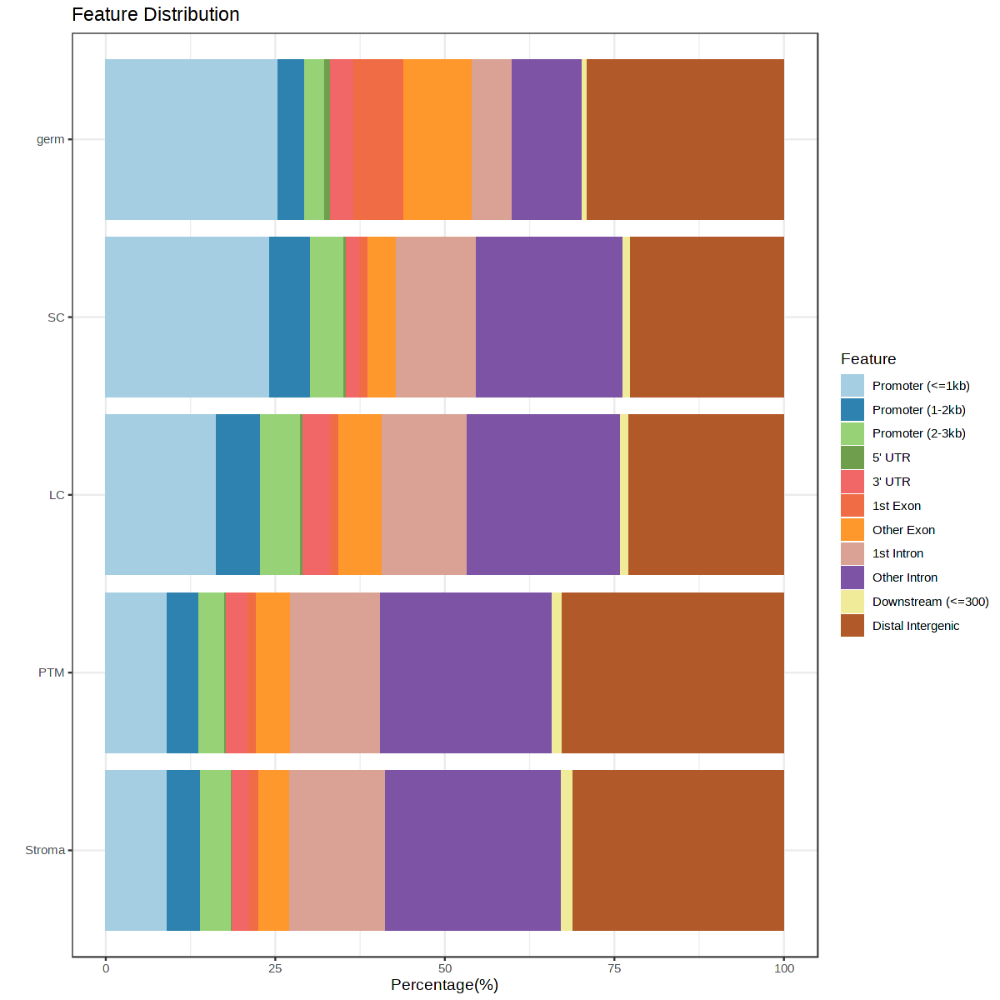

In [32]:
# Chipseeker : TOP 1000 PEAKS
markerList <- getMarkers(markersPeaks, cutOff = "FDR <= 0.01 & Log2FC >= 2", returnGR = TRUE)

useGroup <- list(markerList$`Germ cells`[1:1000],markerList$`Sertoli cells`[1:1000],markerList$`Leydig cells`[1:1000],markerList$PTM[1:1000],markerList$Stroma[1:1000])
names(useGroup) <- c("germ","SC","LC","PTM","Stroma")

peakAnnoList <- lapply(useGroup, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE,annoDb="org.Mm.eg.db")
plotAnnoBar(peakAnnoList)

In [357]:
compGO <- compareCluster(geneCluster   = genes,
                         fun           = "enrichGO",
                         pvalueCutoff  = 0.01,
                         qvalueCutoff  = 0.05,
                         ont="BP",
                         pAdjustMethod = "BH",
                           OrgDb='org.Mm.eg.db' 
#                            organism = "mouse"
                          )
# dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis")

In [308]:
compGO2 <- simplify(compGO)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



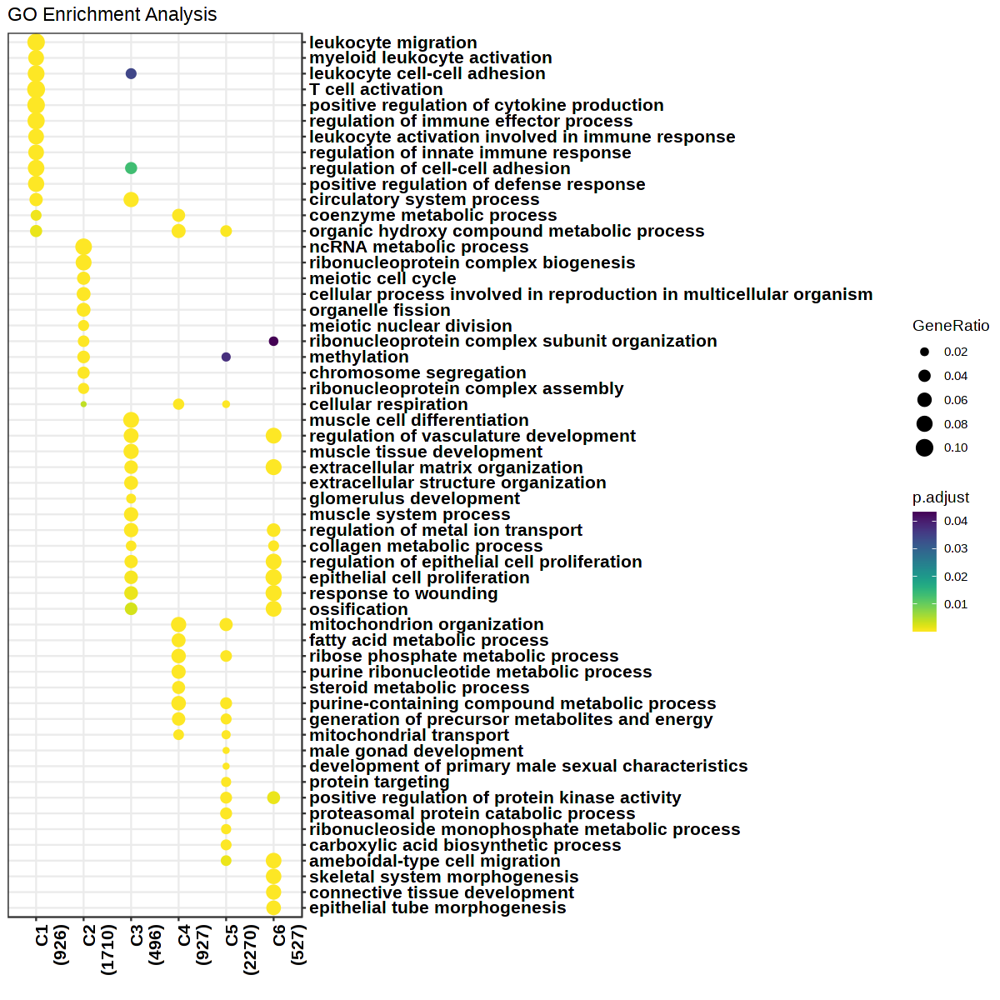

In [310]:
options(repr.plot.height=10,repr.plot.width=10)
dotplot(compGO2, showCategory = 10, title = "GO Enrichment Analysis")+ scale_color_viridis(option = "D",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="bold"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="bold"))+scale_y_discrete(position = "right") 

### 6.4 Motif enrichment in DAR

In [43]:
Merged.proj2 <- addMotifAnnotations(ArchRProj = Merged.proj2, motifSet = "cisbp", name = "Motif",force = TRUE)

No methods found in package 'IRanges' for request: 'score' when loading 'TFBSTools'

ArchR logging to : ArchRLogs/ArchR-addMotifAnnotations-21fb20a72130-Date-2020-11-02_Time-16-51-34.log
If there is an issue, please report to github with logFile!

peakAnnotation name already exists! Overriding.

2020-11-02 16:51:35 : Gettting Motif Set, Species : Mus musculus, 0.004 mins elapsed.

Using version 2 motifs!

2020-11-02 16:51:36 : Finding Motif Positions with motifmatchr!, 0.03 mins elapsed.

2020-11-02 16:54:03 : Creating Motif Overlap Matrix, 2.475 mins elapsed.

2020-11-02 16:54:06 : Finished Getting Motif Info!, 2.52 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-addMotifAnnotations-21fb20a72130-Date-2020-11-02_Time-16-51-34.log



In [52]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = Merged.proj2,
    peakAnnotation = "Motif",
    #original cut-off : 0.1 / 0.5
#     cutOff = "FDR <= 0.1 & Log2FC >= 0.5",
   cutOff = "FDR <= 0.01 & Log2FC >= 2"
  )

ArchR logging to : ArchRLogs/ArchR-peakAnnoEnrichment-22146bc6cbf9-Date-2020-11-24_Time-15-10-54.log
If there is an issue, please report to github with logFile!

2020-11-24 15:10:58 : Computing Enrichments 1 of 7, 0.053 mins elapsed.

2020-11-24 15:10:58 : Computing Enrichments 2 of 7, 0.061 mins elapsed.

2020-11-24 15:10:59 : Computing Enrichments 3 of 7, 0.068 mins elapsed.

2020-11-24 15:10:59 : Computing Enrichments 4 of 7, 0.077 mins elapsed.

2020-11-24 15:11:00 : Computing Enrichments 5 of 7, 0.086 mins elapsed.

2020-11-24 15:11:00 : Computing Enrichments 6 of 7, 0.095 mins elapsed.

2020-11-24 15:11:01 : Computing Enrichments 7 of 7, 0.103 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-peakAnnoEnrichment-22146bc6cbf9-Date-2020-11-24_Time-15-10-54.log



In [53]:
options(repr.plot.width=10,repr.plot.height=10)
heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = 12, transpose = TRUE,clusterCols = TRUE,
                              pal = paletteContinuous(set = "whitePurple", n = 50))
# pdf(file="allcell.DAR.motifenrichment.pdf",height=5,width=10)
pdf(file="allcell.DAR.motifenrichment.v2.pdf",height=5,width=10)
ComplexHeatmap::draw(heatmapEM, heatmap_legend_side = "bot", annotation_legend_side = "bot")
dev.off()

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-22143201fe02-Date-2020-11-24_Time-15-11-05.log
If there is an issue, please report to github with logFile!

Adding Annotations..

Preparing Main Heatmap..



png 
  2

In [52]:
# Plot footprint
# motif name
motifPositions <- getPositions(Merged.proj2)
motifs <- c("Zeb1", "Snai2", "Gata1","Nfya","Rarg", "Myog","Runx1","Pou3f1","Gsx1","Lhx9","Arx","Nr4a1","Nr5a1","Tead4","Tcf21")
markerMotifs <- unlist(lapply(motifs, function(x) grep(x, names(motifPositions), value = TRUE)))
# markerMotifs <- markerMotifs[markerMotifs %ni% "SREBF1_22"]
markerMotifs


[1] "Zeb1_139"   "Snai2_799"  "Gata1_387"  "Nfya_242"   "Rarg_654"  
 [6] "Myog_45"    "Runx1_712"  "Pou3f1_620" "Gsx1_556"   "Lhx9_424"  
[11] "Arx_500"    "Nr4a1_847"  "Nr5a1_848"  "Tead4_868"  "Tcf21_79"

In [54]:
seFoot <- getFootprints(
  ArchRProj = Merged.proj2, 
  positions = motifPositions[markerMotifs], 
    useGroups= c("Germ cells","Stroma","PTM","Sertoli cells","Leydig cells","Macrophages"),
  groupBy = "predictedGroup_Co"
)

ArchR logging to : ArchRLogs/ArchR-getFootprints-21fb39e4ceca-Date-2020-11-02_Time-17-30-12.log
If there is an issue, please report to github with logFile!

2020-11-02 17:30:12 : Computing Kmer Bias Table, 0.006 mins elapsed.

2020-11-02 17:30:32 : Finished Computing Kmer Tables, 0.341 mins elapsed.

2020-11-02 17:30:32 : Computing Footprints, 0.347 mins elapsed.

2020-11-02 17:31:34 : Computing Footprints Bias, 1.366 mins elapsed.

2020-11-02 17:31:58 : Summarizing Footprints, 1.774 mins elapsed.



In [62]:

footpring.pal <- c("Germ cells" = "#272E6A", 
                      "Stroma" = "#D8A767",
                     "PTM" = "#8A9FD1",
                     "Sertoli cells"= "#C06CAB",
                     "Leydig cells" = "#89288F",
                      "Macrophages" =  "#F47D2B"
                     )

footpring.pal

Germ cells        Stroma           PTM Sertoli cells  Leydig cells 
    "#272E6A"     "#D8A767"     "#8A9FD1"     "#C06CAB"     "#89288F" 
  Macrophages 
    "#F47D2B"

In [63]:
### Need to change pal
plotFootprints(
  seFoot = seFoot,
  ArchRProj = Merged.proj2, 
    flank = 100,
  normMethod = "Subtract",
  plotName = "Footprints-Subtract-Bias",
  addDOC = FALSE,
  smoothWindow = 10,
    pal = footpring.pal
)

ArchR logging to : ArchRLogs/ArchR-plotFootprints-21fb2e1d22a2-Date-2020-11-03_Time-10-37-44.log
If there is an issue, please report to github with logFile!

2020-11-03 10:37:45 : Plotting Footprint : Zeb1_139 (1 of 15), 0.004 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2020-11-03 10:37:47 : Plotting Footprint : Snai2_799 (2 of 15), 0.044 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2020-11-03 10:37:48 : Plotting Footprint : Gata1_387 (3 of 15), 0.06 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2020-11-03 10:37:49 : Plotting Footprint : Nfya_242 (4 of 15), 0.076 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2020-11-03 10:37:50 : Plotting Footprint : Rarg_654 (5 of 15), 0.093 mins elapsed.

Applying smoothing window to footprin

In [184]:
Merged.proj2 <- addArchRAnnotations(ArchRProj = Merged.proj2, db = "LOLA",collection = "EncodeTFBS")

ArchR logging to : ArchRLogs/ArchR-addArchRAnnotations-4ed222b335b3-Date-2020-10-21_Time-22-33-23.log
If there is an issue, please report to github with logFile!

Annotating Chromosomes

2020-10-21 22:33:24 : 

	Annotating Chr: chr1

2020-10-21 22:33:24 : 

	Annotating Chr: chr2

2020-10-21 22:33:24 : 

	Annotating Chr: chr3

2020-10-21 22:33:24 : 

	Annotating Chr: chr4

2020-10-21 22:33:24 : 

	Annotating Chr: chr5

2020-10-21 22:33:24 : 

	Annotating Chr: chr6

2020-10-21 22:33:24 : 

	Annotating Chr: chr7

2020-10-21 22:33:24 : 

	Annotating Chr: chr8

2020-10-21 22:33:24 : 

	Annotating Chr: chr9

2020-10-21 22:33:24 : 

	Annotating Chr: chr10

2020-10-21 22:33:25 : 

	Annotating Chr: chr11

2020-10-21 22:33:25 : 

	Annotating Chr: chr12

2020-10-21 22:33:25 : 

	Annotating Chr: chr13

2020-10-21 22:33:25 : 

	Annotating Chr: chr14

2020-10-21 22:33:25 : 

	Annotating Chr: chr15

2020-10-21 22:33:25 : 

	Annotating Chr: chr16

2020-10-21 22:33:25 : 

	Annotating Chr: chr17

2020-1

In [185]:
enrichEncode <- peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = Merged.proj2,
    peakAnnotation = "EncodeTFBS",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  )

ArchR logging to : ArchRLogs/ArchR-peakAnnoEnrichment-4ed25bb951a4-Date-2020-10-21_Time-22-33-26.log
If there is an issue, please report to github with logFile!

2020-10-21 22:33:29 : Computing Enrichments 1 of 7, 0.044 mins elapsed.

2020-10-21 22:33:29 : Computing Enrichments 2 of 7, 0.046 mins elapsed.

2020-10-21 22:33:29 : Computing Enrichments 3 of 7, 0.048 mins elapsed.

2020-10-21 22:33:29 : Computing Enrichments 4 of 7, 0.05 mins elapsed.

2020-10-21 22:33:29 : Computing Enrichments 5 of 7, 0.053 mins elapsed.

2020-10-21 22:33:30 : Computing Enrichments 6 of 7, 0.058 mins elapsed.

2020-10-21 22:33:30 : Computing Enrichments 7 of 7, 0.06 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-peakAnnoEnrichment-4ed25bb951a4-Date-2020-10-21_Time-22-33-26.log



In [186]:
heatmapEncode <- plotEnrichHeatmap(enrichEncode, n = 15, transpose = FALSE)
ComplexHeatmap::draw(heatmapEncode, heatmap_legend_side = "bot", annotation_legend_side = "bot")

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-4ed2567e6403-Date-2020-10-21_Time-22-33-30.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..



# 7.Identify positive regulators

In [64]:
getAvailableMatrices(Merged.proj2)

[1] "Bulk.ATACMatrix"       "GeneIntegrationMatrix" "GeneScoreMatrix"      
[4] "MotifMatrix"           "PeakMatrix"            "TileMatrix"

In [65]:
seGroupMotif <- getGroupSE(ArchRProj = Merged.proj2, useMatrix = "MotifMatrix", groupBy = "predictedGroup_Co")

seZ <- seGroupMotif[rowData(seGroupMotif)$seqnames=="z",]

rowData(seZ)$maxDelta <- lapply(seq_len(ncol(seZ)), function(x){
  rowMaxs(assay(seZ) - assay(seZ)[,x])
}) %>% Reduce("cbind", .) %>% rowMaxs

corGSM_MM <- correlateMatrices(
    ArchRProj = Merged.proj2,
    useMatrix1 = "GeneScoreMatrix",
    useMatrix2 = "MotifMatrix",
    reducedDims = "Harmony"
)

corGIM_MM <- correlateMatrices(
    ArchRProj = Merged.proj2,
    useMatrix1 = "GeneIntegrationMatrix",
    useMatrix2 = "MotifMatrix",
    reducedDims = "Harmony"
)

corGSM_MM$maxDelta <- rowData(seZ)[match(corGSM_MM$MotifMatrix_name, rowData(seZ)$name), "maxDelta"]
corGIM_MM$maxDelta <- rowData(seZ)[match(corGIM_MM$MotifMatrix_name, rowData(seZ)$name), "maxDelta"]

ArchR logging to : ArchRLogs/ArchR-getGroupSE-30006a0e8684-Date-2020-11-27_Time-16-23-50.log
If there is an issue, please report to github with logFile!

Getting Group Matrix

2020-11-27 16:23:51 : Constructing Group Matrix 1 of 2, 0.001 mins elapsed.

2020-11-27 16:23:56 : Finished Group Matrix 1 of 2, 0.096 mins elapsed.

2020-11-27 16:23:56 : Constructing Group Matrix 2 of 2, 0.096 mins elapsed.

2020-11-27 16:24:01 : Finished Group Matrix 2 of 2, 0.18 mins elapsed.

2020-11-27 16:24:01 : Successfully Created Group Matrix, 0.18 mins elapsed.

Normalizing by number of Cells

ArchR logging successful to : ArchRLogs/ArchR-getGroupSE-30006a0e8684-Date-2020-11-27_Time-16-23-50.log

ArchR logging to : ArchRLogs/ArchR-correlateMatrices-300053b2d9c5-Date-2020-11-27_Time-16-24-03.log
If there is an issue, please report to github with logFile!

When accessing features from a matrix of class Sparse.Assays.Matrix it requires 1 seqname!
Continuing with first seqname 'z'!
If confused, try getFeat

In [68]:
corGSM_MM <- corGSM_MM[order(abs(corGSM_MM$cor), decreasing = TRUE), ]
corGSM_MM <- corGSM_MM[which(!duplicated(gsub("\\-.*","",corGSM_MM[,"MotifMatrix_name"]))), ]
corGSM_MM$TFRegulator <- "NO"
corGSM_MM$TFRegulator[which(corGSM_MM$cor > 0.5 & corGSM_MM$padj < 0.05 & corGSM_MM$maxDelta > quantile(corGSM_MM$maxDelta, 0.7))] <- "YES"
sort(corGSM_MM[corGSM_MM$TFRegulator=="YES",1])

[1] "Atf3"  "Atf6b" "Creb1" "Dmrt1" "Dmrt3" "Esr2"  "Figla" "Fosl1" "Gata6"
[10] "Gli1"  "Gli2"  "Klf6"  "Myog"  "Nfkb1" "Nfya"  "Nr6a1" "Runx1" "Runx3"
[19] "Sox18" "Sp4"   "Stat3" "Tcf15" "Tcf21" "Yy1"

In [71]:
corGIM_MM <- corGIM_MM[order(abs(corGIM_MM$cor), decreasing = TRUE), ]
corGIM_MM <- corGIM_MM[which(!duplicated(gsub("\\-.*","",corGIM_MM[,"MotifMatrix_name"]))), ]
corGIM_MM$TFRegulator <- "NO"
#Final version (0.3,0.05,0.7)
corGIM_MM$TFRegulator[which(corGIM_MM$cor > 0.5 & corGIM_MM$padj < 0.05 & corGIM_MM$maxDelta > quantile(corGIM_MM$maxDelta, 0.7))] <- "YES"
# Negative correlation
# corGIM_MM$TFRegulator[which(corGIM_MM$cor < -1 & corGIM_MM$padj < 0.1 & corGIM_MM$maxDelta > quantile(corGIM_MM$maxDelta, 0.5))] <- "YES"


sort(corGIM_MM[corGIM_MM$TFRegulator=="YES",1])

[1] "Ar"    "Dmrt1" "Dmrt3" "Figla" "Gata1" "Gata4" "Gata6" "Gli1"  "Gli2" 
[10] "Hoxb1" "Irf2"  "Jun"   "Mef2c" "Mesp1" "Mesp2" "Nr5a1" "Rara"  "Rest" 
[19] "Runx1" "Sox12" "Sox18" "Sox4"  "Sox6"  "Sox8"  "Sox9"  "Tcf21"

In [72]:
corGIM_MM$variableTF <- "NO"
corGIM_MM$variableTF[which(corGIM_MM$maxDelta > quantile(corGIM_MM$maxDelta, 0.7))] <- "only.delta"

In [74]:
postiveTF <- corGIM_MM$GeneIntegrationMatrix_name[corGIM_MM$TFRegulator=="YES"]
variableTF <- corGIM_MM$GeneIntegrationMatrix_name[corGIM_MM$variableTF=="only.delta"]

In [75]:
variableTF

[1] "Dmrt3"   "Dmrt1"   "Tcf21"   "Hic1"    "Ar"      "Mesp1"   "Sox4"   
  [8] "Gata1"   "Mesp2"   "Figla"   "Gata4"   "Sox18"   "Snai2"   "Nr5a1"  
 [15] "Mef2b"   "Sox9"    "Gli1"    "Gata6"   "Runx1"   "Zeb1"    "Sox12"  
 [22] "Patz1"   "Id3"     "Sox8"    "Rest"    "Nr2f2"   "Rara"    "Gli2"   
 [29] "Jun"     "Mef2c"   "Hoxb1"   "Sox6"    "Irf2"    "Rarg"    "Rel"    
 [36] "Xbp1"    "Tead3"   "Ctcf"    "Bcl6"    "Elk1"    "Mef2a"   "Runx3"  
 [43] "Nr2c1"   "Tcf4"    "Nr3c2"   "Smarcc1" "Stat5b"  "Cebpb"   "Nfya"   
 [50] "Nfkb1"   "E2f6"    "Esr2"    "Junb"    "Scx"     "Creb1"   "Mef2d"  
 [57] "Hsf1"    "Klf5"    "Atf2"    "Klf6"    "Fli1"    "Myf6"    "Pbx3"   
 [64] "Runx2"   "Sox7"    "Atoh8"   "Prdm4"   "Bach1"   "Crem"    "Irf1"   
 [71] "Stat2"   "Nfic"    "Atf6"    "Dmrta2"  "Nhlh2"   "Batf3"   "Stat3"  
 [78] "Klf3"    "Atf7"    "Klf15"   "Nr2f1"   "Ascl2"   "Fosl1"   "Nr6a1"  
 [85] "Sox10"   "Spib"    "Nr1h4"   "Stat1"   "Sox15"   "Gata2"   "Fos"    
 [92] "Zfp740"  "Myf5"    "Maz"     "Jund"    "Nr5a2"   "Tcf3"    "Yy1"    
 [99] "Lyl1"    "Tal1"    "Ybx1"    "Etv3"    "Pou3f2"  "Sox11"   "Klf1"   
[106] "Fosb"    "Zfp281"  "Rxrb"    "Klf16"   "Sox5"    "Nr4a3"   "Gli3"   
[113] "Zbtb1"   "Creb3"   "Klf12"   "Foxl1"   "Elf1"    "Jdp2"    "Msc"    
[120] "Bach2"   "Mecp2"   "Nfia"    "Etv2"    "Elf2"    "Batf"    "Etv4"   
[127] "Sp3"     "Etv1"    "Hic2"    "Foxl1"   "Elf4"    "Nr2f6"   "Bcl11a" 
[134] "Zfp219"  "Erf"     "Gabpa"   "Tcf12"   "Etv5"    "Nfe2"    "Pou6f1" 
[141] "Sox3"    "Nfix"    "Sp6"     "Atf5"    "Klf11"   "Ahctf1"  "Klf8"   
[148] "Stat5a"  "Esrrg"   "Bcl11b"  "Ehf"     "Esrra"   "Atf6b"   "Klf4"   
[155] "Stat4"   "Sox30"   "Ets2"    "Klf14"   "Foxl1"   "Pgr"     "Id4"    
[162] "Zfp410"  "Zfp42"   "Elf3"    "Rarb"    "Nfib"    "Nr4a1"   "Gata3"  
[169] "Fev"     "Mbtps2"  "Cebpg"   "Klf7"    "Scrt1"   "Spic"    "Nfe2l2" 
[176] "Klf2"    "Nr3c1"   "Tcf15"   "Zfp354c" "Sp5"     "Zfp784"  "Ets1"   
[183] "Cebpd"   "Ybx2"    "Sp4"     "Elk3"    "Arnt2"   "Esrrb"   "Zkscan5"
[190] "Rela"    "Etv6"    "Elk4"    "Sox21"   "Klf13"   "Esr1"    "Ctcfl"  
[197] "Sp7"     "Sp2"     "E4f1"    "Tead4"   "Creb3l3" "Zfp148"  "Erg"    
[204] "Atf1"    "Myog"    "Ascl1"   "Pou6f2"  "Sp9"     "Nr1h5"   "Sox14"

In [ ]:
ggplot(Hint, aes(x=logNum, y=TF_Activity,label=X)) + geom_point(colour="darkred") +
gghighlight(P_values < 0.05, Num > 100,label_key = type) +
theme_ArchR() +
     xlim(1,5) +
geom_label_repel(aes(label = X),
                  box.padding   = 0.8, 
                 label.size = 0.1,
                  point.padding = 0.8,
                  segment.size = 0.2,
                  segment.color = 'grey50')

In [113]:
pdf(file="allcell.positiveTF.pdf",width=8,height=8)
ggplot(data.frame(corGSM_MM), aes(cor, maxDelta, lable = GeneScoreMatrix_name))+ 
geom_point(colour="darkred",size=2) +
theme_ArchR()+
gghighlight(cor > 0.3 & padj < 0.05 & maxDelta > quantile(corGIM_MM$maxDelta, 0.7)) +
geom_label_repel(aes(label = GeneScoreMatrix_name),
                  box.padding   = 0.5, 
                 label.size = 0.1,
                  point.padding = 0.5,
                  segment.size = 0.5,
                  segment.color = 'grey50')
dev.off()

Warning message:
"Removed 7 rows containing missing values (geom_point)."


png 
  2

In [ ]:
## Plot heatmap of positive regulator
blueYellow2 = c("1"="#352A86","2"="#343DAE","3"="#0262E0","4"="#1389D2","5"="#2DB7A3","6"="#A5BE6A","7"="#F8BA43","8"="#F6DA23")
blueYellow2 <- colorRampPalette(blueYellow2)(256)

In [173]:
# tiff(file="allcell.positiveTF.example.umap.tiff",width=5,height=5)
# tiff(file="allcell.positiveTF.example.umap.tiff",units="in", width=5, height=5, res=300)
# positiveTF.sel <- c("Ar","Sox9","Tcf21","Figla","Dmrt1","Dmrt3","Gli2","Runx1","Gata6","Nr5a1","Nr2c1")\
positiveTF.sel <- c("Dmrt1","Sox9","Nr5a1","Tcf21","Gli2")
options(repr.plot.width=5,repr.plot.height=5)
p1 <- plotEmbedding(
    ArchRProj = Merged.proj2, 
    colorBy = "GeneScoreMatrix", 
    name = positiveTF.sel, 
    embedding = "UMAPHarmony",
    size = 1,
    baseSize = 2,
    rastr = TRUE,
    pal = horizonExtra2,
#     plotAs = "points",
     imputeWeights = getImputeWeights(Merged.proj2),
     quantCut = c(0.1, 0.9)
    
)
p2 <- plotEmbedding(
    ArchRProj = Merged.proj2, 
    colorBy = "GeneIntegrationMatrix", 
    name = positiveTF.sel, 
    embedding = "UMAPHarmony",
    size = 1,
    rastr = TRUE,
    baseSize = 2,
    pal = blueYellow2,
#     plotAs = "points",
     imputeWeights = getImputeWeights(Merged.proj2),
     quantCut = c(0.1, 0.9)
    
)
positiveTF.sel.motif <- c("z:Dmrt1_251","z:Sox9_725","z:Nr5a1_848","z:Tcf21_79","z:Gli2_815")


p3 <- plotEmbedding(
    ArchRProj = Merged.proj2, 
    colorBy = "MotifMatrix", 
    name = positiveTF.sel.motif, 
    embedding = "UMAPHarmony",
    size = 1,
    rastr = TRUE,
    baseSize = 2,
#     plotAs = "points",
     imputeWeights = getImputeWeights(Merged.proj2),
     quantCut = c(0.1, 0.9)
    
)

p1.1 <- lapply(p1, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0.2, 0.2, 0.2, 0.2), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank())
   })
p2.1 <- lapply(p2, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0.2, 0.2, 0.2, 0.2), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank())
   })
p3.1 <- lapply(p3, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0.2, 0.2, 0.2, 0.2), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})


Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb7c93836-Date-2020-11-03_Time-23-43-19.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2020-11-03 23:43:19 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb7c93836-Date-2020-11-03_Time-23-43-19.log

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb5f6ebd0-Date-2020-11-03_Time-23-43-45.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneIntegrationMatrix

Getting Matrix Values...

2020-11-03 23:43:45 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb5f6

png 
  2

png 
  2

png 
  2

In [ ]:
pdf(file="allcell.positiveTF.GS.umap.pdf",width=12,height=4)
    do.call(cowplot::plot_grid, c(list(ncol = 5),p1.1))
dev.off()
pdf(file="allcell.positiveTF.GIM.umap.pdf",width=12,height=4)
    do.call(cowplot::plot_grid, c(list(ncol = 5),p2.1))
dev.off()
pdf(file="allcell.positiveTF.MS.umap.pdf",width=12,height=4)
    do.call(cowplot::plot_grid, c(list(ncol = 5),p3.1))
 dev.off()

png 
  2

png 
  2

In [166]:
pdf(file="allcell.positiveTF.sox9.umap2.svg",width=6,height=12)
p1 <- plotEmbedding(ArchRProj = Merged.proj2, keepAxis = FALSE, baseSize = 2, colorBy = "GeneScoreMatrix", name = "Sox9", embedding = "UMAPHarmony",size = 1,pal = horizonExtra2,imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p2 <- plotEmbedding( ArchRProj = Merged.proj2,  keepAxis = FALSE, baseSize = 2,colorBy = "GeneIntegrationMatrix",  name = "Sox9", embedding = "UMAPHarmony", size = 1,pal = blueYellow2,imputeWeights = getImputeWeights(Merged.proj2), quantCut = c(0.1, 0.9))
p3 <- plotEmbedding(ArchRProj = Merged.proj2, keepAxis = FALSE, baseSize = 2, colorBy = "MotifMatrix", name = "z:Sox9_725", embedding = "UMAPHarmony", size = 1, imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p1 / p2 / p3
dev.off()

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb2d7410c8-Date-2020-11-03_Time-23-14-18.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2020-11-03 23:14:18 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb2d7410c8-Date-2020-11-03_Time-23-14-18.log

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb624eec00-Date-2020-11-03_Time-23-14-36.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneIntegrationMatrix

Getting Matrix Values...

2020-11-03 23:14:36 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb624eec00-Date-2020-11-03

png 
  2

In [163]:
## plot individual pair
pdf(file="allcell.positiveTF.sox9.umap.pdf",width=5,height=10)
p1 <- plotEmbedding(ArchRProj = Merged.proj2,  colorBy = "GeneScoreMatrix", name = "Sox9", embedding = "UMAPHarmony",size = 1,pal = horizonExtra2,imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p2 <- plotEmbedding( ArchRProj = Merged.proj2,  colorBy = "GeneIntegrationMatrix",  name = "Sox9", embedding = "UMAPHarmony", size = 1,pal = blueYellow2,imputeWeights = getImputeWeights(Merged.proj2), quantCut = c(0.1, 0.9))
p3 <- plotEmbedding(ArchRProj = Merged.proj2, colorBy = "MotifMatrix", name = "z:Sox9_725", embedding = "UMAPHarmony", size = 1, imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p1 + p2 + p3
dev.off()
pdf(file="allcell.positiveTF.tcf21.umap.pdf",width=10,height=5)
p1 <- plotEmbedding(ArchRProj = Merged.proj2,  colorBy = "GeneScoreMatrix", name = "Tcf21", embedding = "UMAPHarmony",size = 1,pal = horizonExtra2,imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p2 <- plotEmbedding( ArchRProj = Merged.proj2,  colorBy = "GeneIntegrationMatrix",  name = "Tcf21", embedding = "UMAPHarmony", size = 1,pal = blueYellow2,imputeWeights = getImputeWeights(Merged.proj2), quantCut = c(0.1, 0.9))
p3 <- plotEmbedding(ArchRProj = Merged.proj2, colorBy = "MotifMatrix", name = "z:Tcf21_79", embedding = "UMAPHarmony", size = 1, imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p1 + p2 + p3
dev.off()
pdf(file="allcell.positiveTF.Dmrt1.umap.pdf",width=10,height=5)
p1 <- plotEmbedding(ArchRProj = Merged.proj2,  colorBy = "GeneScoreMatrix", name = "Dmrt1", embedding = "UMAPHarmony",size = 1,pal = horizonExtra2,imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p2 <- plotEmbedding( ArchRProj = Merged.proj2,  colorBy = "GeneIntegrationMatrix",  name = "Dmrt1", embedding = "UMAPHarmony", size = 1,pal = blueYellow2,imputeWeights = getImputeWeights(Merged.proj2), quantCut = c(0.1, 0.9))
p3 <- plotEmbedding(ArchRProj = Merged.proj2, colorBy = "MotifMatrix", name = "z:Dmrt1_251", embedding = "UMAPHarmony", size = 1, imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p1 + p2 + p3
dev.off()
pdf(file="allcell.positiveTF.Nr5a1.umap.pdf",width=10,height=5)
p1 <- plotEmbedding(ArchRProj = Merged.proj2,  colorBy = "GeneScoreMatrix", name = "Nr5a1", embedding = "UMAPHarmony",size = 1,pal = horizonExtra2,imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p2 <- plotEmbedding( ArchRProj = Merged.proj2,  colorBy = "GeneIntegrationMatrix",  name = "Nr5a1", embedding = "UMAPHarmony", size = 1,pal = blueYellow2,imputeWeights = getImputeWeights(Merged.proj2), quantCut = c(0.1, 0.9))
p3 <- plotEmbedding(ArchRProj = Merged.proj2, colorBy = "MotifMatrix", name = "z:Nr5a1_848", embedding = "UMAPHarmony", size = 1, imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p1 + p2 + p3
dev.off()
pdf(file="allcell.positiveTF.Gli2.umap.pdf",width=10,height=5)
p1 <- plotEmbedding(ArchRProj = Merged.proj2,  colorBy = "GeneScoreMatrix", name = "Gli2", embedding = "UMAPHarmony",size = 1,pal = horizonExtra2,imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p2 <- plotEmbedding( ArchRProj = Merged.proj2,  colorBy = "GeneIntegrationMatrix",  name = "Gli2", embedding = "UMAPHarmony", size = 1,pal = blueYellow2,imputeWeights = getImputeWeights(Merged.proj2), quantCut = c(0.1, 0.9))
p3 <- plotEmbedding(ArchRProj = Merged.proj2, colorBy = "MotifMatrix", name = "z:Gli2_815", embedding = "UMAPHarmony", size = 1, imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))
p1 + p2 + p3
dev.off()

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb2dd15d7e-Date-2020-11-03_Time-22-49-51.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2020-11-03 22:49:52 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb2dd15d7e-Date-2020-11-03_Time-22-49-51.log

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb3142cbba-Date-2020-11-03_Time-22-50-09.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneIntegrationMatrix

Getting Matrix Values...

2020-11-03 22:50:10 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb3142cbba-Date-2020-11-03

png 
  2

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb3b163006-Date-2020-11-03_Time-22-50-46.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2020-11-03 22:50:47 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb3b163006-Date-2020-11-03_Time-22-50-46.log

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-21fb65642329-Date-2020-11-03_Time-22-51-01.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneIntegrationMatrix

Getting Matrix Values...

2020-11-03 22:51:02 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-21fb65642329-Date-2020-11-03

png 
  2

In [336]:
corGIM_MM$GeneIntegrationMatrix_name %>% head(n=50)

[1] "Arx"    "Lhx9"   "Ar"     "Tcf21"  "Hic1"   "Mesp2"  "Dmrt1"  "Rora"  
 [9] "Hoxd8"  "Sox12"  "Mef2b"  "Figla"  "Gata4"  "Tgif1"  "Hoxc6"  "Mesp1" 
[17] "Dmrta1" "Dmrt3"  "Nr5a1"  "Hoxd9"  "Sox8"   "Sox4"   "Sox9"   "Snai2" 
[25] "Lcor"   "Gata1"  "Nfkb1"  "Otx1"   "Osr1"   "Tbx2"   "Tcf7"   "Hoxc8" 
[33] "Gata6"  "Rest"   "Rorc"   "Hlf"    "Runx1"  "Dmrtc2" "Hoxc10" "Xbp1"  
[41] "Hoxc9"  "Hhex"   "Zfp711" "Nr2f2"  "Id3"    "Gli1"   "Rarg"   "Arid3a"
[49] "Nr3c2"  "Id1"

In [ ]:
### ploting 
pos.TF.gene <- c('Crem','Hif3a','Usf1','Hic1','Jun') 

emtplot.pos.TF.gene <- plotEmbedding(
    ArchRProj = EMT.proj, 
    colorBy = "GeneScoreMatrix", 
    name = sort(corGSM_MM[corGSM_MM$TFRegulator=="YES",1]), 
    embedding = "UMAP",
    size = 3,
    plotAs = "points",
    imputeWeights = getImputeWeights(EMT.proj),
     quantCut = c(0.1, 0.9)
    
)



In [ ]:
options(repr.plot.width=8)
p1 <- lapply(emtplot.pos.TF.gene, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p1))

In [ ]:
pos.markerMotifs <- c("z:Crem_134","z:Hif3a_869","z:Usf1_46","z:Hic1_198","z:Jun_126")

In [ ]:
postf_embed <- plotEmbedding(
    ArchRProj = EMT.proj, 
    colorBy = "MotifMatrix", 
    name = pos.markerMotifs, 
    embedding = "UMAP",
    size=3,
    plotAs="points",
    imputeWeights = getImputeWeights(EMT.proj)
)

In [ ]:
p3 <- lapply(postf_embed, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 10) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 5),p3))
# pdf(file=here("EMT_Variable-EncodeTFBS-Deviation-Scores.UMAP.pdf"),width=10,height=4)
# p3 <- lapply(p_embed, function(x){
#     x + guides(color = FALSE, fill = FALSE) + 
#     theme_ArchR(baseSize = 6) +
#     theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
#     theme(
#         axis.text.x=element_blank(), 
#         axis.ticks.x=element_blank(), 
#         axis.text.y=element_blank(), 
#         axis.ticks.y=element_blank()
#     )
# })
# do.call(cowplot::plot_grid, c(list(ncol = 5),p3))
# dev.off()



# 8. Co-accessibility analysis

In [9]:
Merged.proj2 <- addCoAccessibility(
    ArchRProj = Merged.proj2,
    reducedDims = "Harmony"
)

cA <- getCoAccessibility(
    ArchRProj = Merged.proj2,
    corCutOff = 0.3,
    resolution = 1,
    returnLoops = TRUE
)

Merged.proj2 <- addPeak2GeneLinks(
    ArchRProj = Merged.proj2,
    reducedDims = "Harmony"
)

p2g <- getPeak2GeneLinks(
    ArchRProj = Merged.proj2,
    corCutOff = 0.3,
    resolution = 1,
    returnLoops = TRUE
)
p2g.df <- getPeak2GeneLinks(
    ArchRProj = Merged.proj2,
    corCutOff = 0.3,
    resolution = 1,
    returnLoops = FALSE
)





ArchR logging to : ArchRLogs/ArchR-addCoAccessibility-30009474d76-Date-2020-11-27_Time-11-16-13.log
If there is an issue, please report to github with logFile!

2020-11-27 11:16:13 : Computing KNN, 0.004 mins elapsed.

2020-11-27 11:16:14 : Identifying Non-Overlapping KNN pairs, 0.018 mins elapsed.

2020-11-27 11:16:16 : Identified 496 Groupings!, 0.048 mins elapsed.

2020-11-27 11:16:19 : Computing Co-Accessibility chr1 (1 of 21), 0.099 mins elapsed.

2020-11-27 11:16:27 : Computing Co-Accessibility chr2 (2 of 21), 0.225 mins elapsed.

2020-11-27 11:16:35 : Computing Co-Accessibility chr3 (3 of 21), 0.364 mins elapsed.

2020-11-27 11:16:40 : Computing Co-Accessibility chr4 (4 of 21), 0.451 mins elapsed.

2020-11-27 11:16:47 : Computing Co-Accessibility chr5 (5 of 21), 0.573 mins elapsed.

2020-11-27 11:16:55 : Computing Co-Accessibility chr6 (6 of 21), 0.692 mins elapsed.

2020-11-27 11:17:00 : Computing Co-Accessibility chr7 (7 of 21), 0.788 mins elapsed.

2020-11-27 11:17:08 : Compu

In [28]:
p2g <- getPeak2GeneLinks(
    ArchRProj = Merged.proj2,
    corCutOff = 0.3,
    resolution = 1,
    returnLoops = TRUE
)
p2g.df <- getPeak2GeneLinks(
    ArchRProj = Merged.proj2,
    corCutOff = 0.3,
    resolution = 1,
    returnLoops = FALSE
)

In [41]:

p2g.heatmap.df %>% 
    dplyr::select(peak,gene,Correlation,FDR,VarQATAC,VarQRNA,cluster) %>%
    arrange(cluster) %>%
    write.table(file="allcell.p2g.heatmap.cluster.summary.txt",sep="\t",quote=FALSE,row.names = FALSE)


In [31]:
Merged.proj2 <- addPeak2GeneLinks(
    ArchRProj = Merged.proj2,
    reducedDims = "Harmony"
)
p2g.mtx <- plotPeak2GeneHeatmap(ArchRProj = Merged.proj2, corCutOff = 0.5,groupBy = "predictedGroup_Co",k = 6,returnMat=TRUE)
saveRDS(p2g.mtx,file="allcell.addp2g.rds")
p2g.heatmap.df <- p2g.mtx[[3]]@listData %>% as.data.frame %>% dplyr::mutate(cluster = p2g.mtx[[1]][[2]])
# p2g.heatmap.df %>% filter(cluster == "4")  %>% arrange(desc(VarQRNA)) 
# p2g.heatmap.df %>% filter(cluster == "2")  %>% arrange(desc(freq(gene))) 
p2g.heatmap.df %>% filter(gene == "Lepr")

ArchR logging to : ArchRLogs/ArchR-addPeak2GeneLinks-19ac7bebaa89-Date-2021-01-14_Time-11-49-11.log
If there is an issue, please report to github with logFile!

2021-01-14 11:49:12 : Getting Available Matrices, 0.002 mins elapsed.

2021-01-14 11:49:12 : Filtered Low Prediction Score Cells (98 of 25613, 0.004), 0.001 mins elapsed.

2021-01-14 11:49:12 : Computing KNN, 0.004 mins elapsed.

2021-01-14 11:49:13 : Identifying Non-Overlapping KNN pairs, 0.013 mins elapsed.

2021-01-14 11:49:15 : Identified 496 Groupings!, 0.045 mins elapsed.

2021-01-14 11:49:15 : Getting Group RNA Matrix, 0.046 mins elapsed.

2021-01-14 11:52:05 : Getting Group ATAC Matrix, 2.886 mins elapsed.

2021-01-14 11:53:55 : Normalizing Group Matrices, 4.71 mins elapsed.

2021-01-14 11:54:01 : Finding Peak Gene Pairings, 4.811 mins elapsed.

2021-01-14 11:54:01 : Computing Correlations, 4.819 mins elapsed.

2021-01-14 11:54:12 : Completed Peak2Gene Correlations!, 4.995 mins elapsed.

ArchR logging successful to : Ar

idxATAC,idxRNA,Correlation,FDR,VarQATAC,VarQRNA,peak,gene,cluster
<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<int>


In [211]:
C1.name <- p2g.heatmap.df %>% filter(cluster == "1") %>% dplyr::select(gene) %>% unique()
C2.name <- p2g.heatmap.df %>% filter(cluster == "2") %>% dplyr::select(gene) %>% unique()
C3.name <- p2g.heatmap.df %>% filter(cluster == "3") %>% dplyr::select(gene) %>% unique()
C4.name <- p2g.heatmap.df %>% filter(cluster == "4") %>% dplyr::select(gene) %>% unique()
C5.name <- p2g.heatmap.df %>% filter(cluster == "5") %>% dplyr::select(gene) %>% unique()
C6.name <- p2g.heatmap.df %>% filter(cluster == "6") %>% dplyr::select(gene) %>% unique()

In [230]:
C1.name <- bitr(C1.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
C2.name <- bitr(C2.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
C3.name <- bitr(C3.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
C4.name <- bitr(C4.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
C5.name <- bitr(C5.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
C6.name <- bitr(C6.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")

'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(C1.name$gene, toType = "ENTREZID", fromType = "SYMBOL", :
"0.82% of input gene IDs are fail to map..."
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(C2.name$gene, toType = "ENTREZID", fromType = "SYMBOL", :
"0.83% of input gene IDs are fail to map..."
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(C3.name$gene, toType = "ENTREZID", fromType = "SYMBOL", :
"1.51% of input gene IDs are fail to map..."
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(C4.name$gene, toType = "ENTREZID", fromType = "SYMBOL", :
"0.81% of input gene IDs are fail to map..."
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(C5.name$gene, toType = "ENTREZID", fromType = "SYMBOL", :
"0.75% of input gene IDs are fail to map..."
'select()' returned 1:1 mapping between keys and columns

Warning message i

In [238]:
# GO analysis of genes in 6 clusters
go_enrich1 <- enrichGO(gene = C1.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.10)
go_enrich2 <- enrichGO(gene = C2.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.10)
go_enrich3 <- enrichGO(gene = C3.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.10)
go_enrich4 <- enrichGO(gene = C4.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.10)
go_enrich5 <- enrichGO(gene = C5.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.10)
go_enrich6 <- enrichGO(gene = C6.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.10)



In [321]:
options(repr.plot.width=10,repr.plot.height=5)
g1 <- dotplot(go_enrich1, showCategory = 10, title = "Cluster 1")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right") 
g2 <- dotplot(go_enrich2, showCategory = 10, title = "Cluster 2")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right")
g3 <- dotplot(go_enrich3, showCategory = 10, title = "Cluster 3")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right")
g4 <- dotplot(go_enrich4, showCategory = 10, title = "Cluster 4")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right")
g5 <- dotplot(go_enrich5, showCategory = 10, title = "Cluster 5")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right")
g6 <- dotplot(go_enrich6, showCategory = 10, title = "Cluster 6")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right")

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'size' is already present. Adding another scale for 'size', which
will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'size' is already present. Adding another scale for 'size', which
will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'size' is already present. Adding another scale for 'size', which
will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'size' is already present. Adding another scale for 'size', which
will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existin

In [322]:
options(repr.plot.width=14,repr.plot.height=8)
library(patchwork)
pdf(file="allcell.p2g.cluster.GO.pdf",width=14,height=10)
(g1 / g2 / g3) | (g4 / g5/ g6)
dev.off()

png 
  2

Loading required package: viridisLite

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



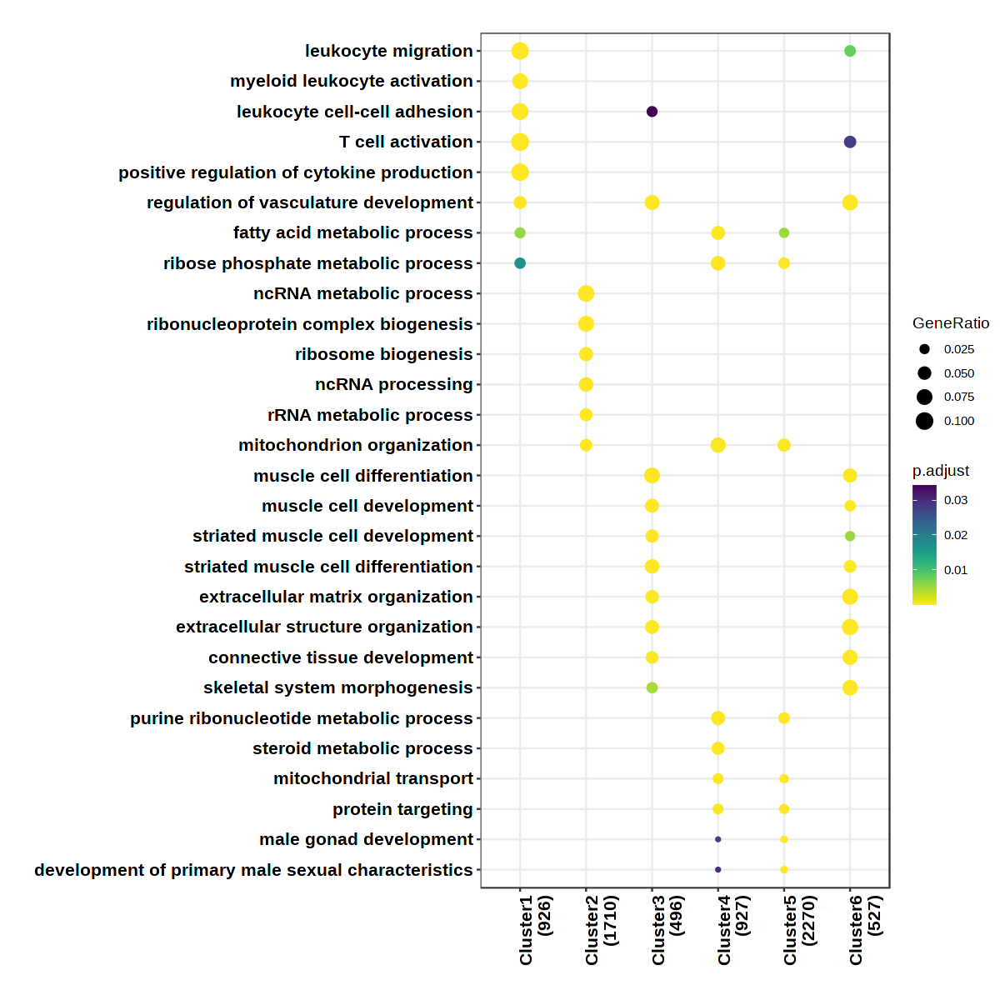

In [242]:
library("viridis") 
# pdf(file="cisTopic_EMT_topic_clusterprofiler.dotplot.pdf",width=7, height=5)
merge_result(list("Cluster1"=go_enrich1, "Cluster2"=go_enrich2,"Cluster3"=go_enrich3,"Cluster4"=go_enrich4,"Cluster5"=go_enrich5,"Cluster6"=go_enrich6))  %>%
    dotplot() + scale_color_viridis(option = "D",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="bold"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=18,face="bold"))
# dev.off()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



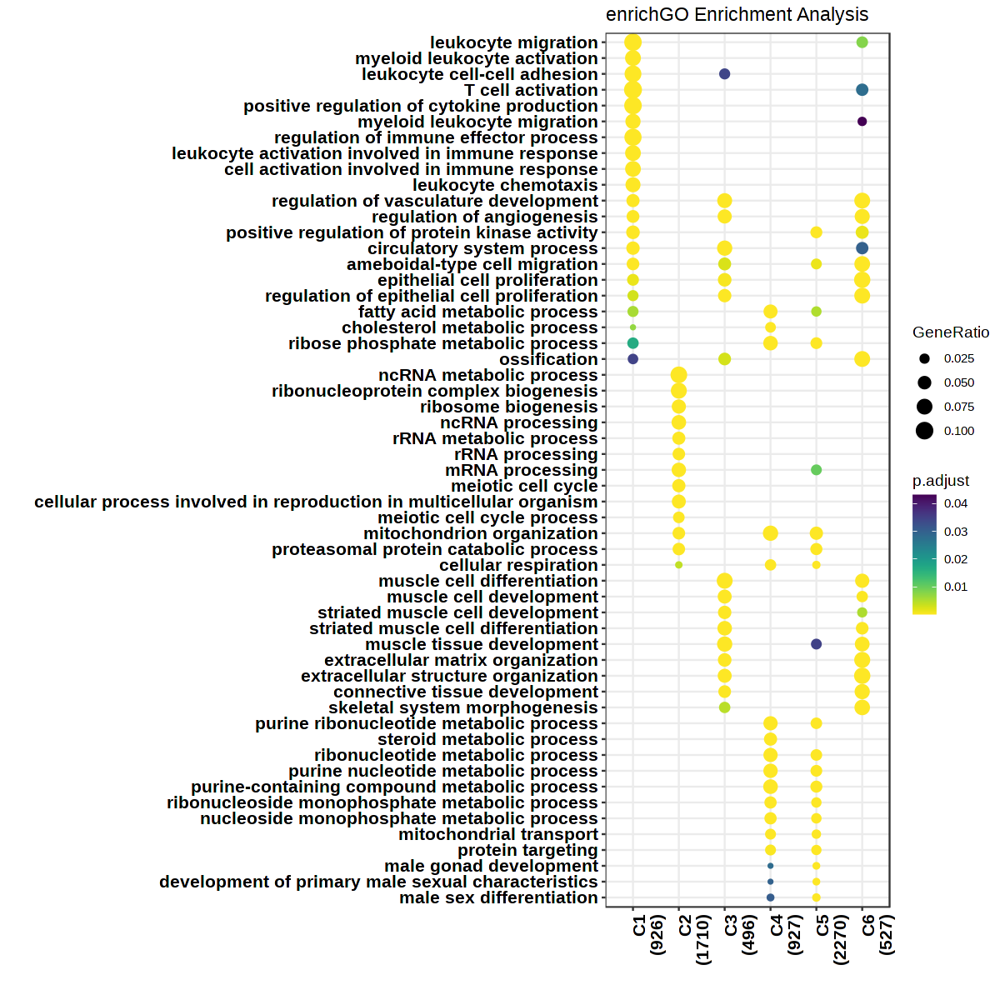

In [246]:

options(repr.plot.height=10,repr.plot.width=10)
dotplot(compGO, showCategory = 10, title = "enrichGO Enrichment Analysis") +
scale_color_viridis(option = "D",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="bold"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=18,face="bold"))

## 9. custom enrichment

In [ ]:
BulkPeaks <- c(
  SC = "../GSM1281688_E15.5_Sox9CFP.peaks.mm10.bed",
  spg = "../GSM2751121_ATAC_Thy1-Spg_Scml2-WT_rep2.tab.uniq.bed"
)

In [377]:
SC <- read.table(file="../GSM1281688_E15.5_Sox9CFP.peaks.mm10.bed")
SC <- as.data.frame(SC)
colnames(SC) <- c("chr","start","end","value1","value2","value3")
SC.gr <- SC %>% makeGRangesFromDataFrame() 
spg <- read.table(file="../GSM2751121_ATAC_Thy1-Spg_Scml2-WT_rep2.tab.uniq.bed")
spg <- as.data.frame(spg)
colnames(spg) <- c("chr","start","end","value1","value2","value3")
spg.gr <- spg %>% makeGRangesFromDataFrame()

In [391]:
BulkPeaks <- list(SC = SC.gr,SPG = spg.gr)
if("ChIP" %ni% names(Merged.proj2@peakAnnotation)){
    Merged.proj2 <- addPeakAnnotations(ArchRProj = Merged.proj2, regions = BulkPeaks, name = "Bulk.ATAC",force = TRUE)
}

ArchR logging to : ArchRLogs/ArchR-addPeakAnnotations-3067594f62f2-Date-2020-10-17_Time-19-57-45.log
If there is an issue, please report to github with logFile!

peakAnnotation name already exists! Overriding.

2020-10-17 19:57:46 : 

2020-10-17 19:57:46 : Creating Peak Overlap Matrix, 0.012 mins elapsed.



In [392]:
Merged.proj2 <- addBgdPeaks(Merged.proj2,force=TRUE)

Identifying Background Peaks!



In [395]:
 Merged.proj2 <- addDeviationsMatrix(
  ArchRProj =  Merged.proj2, 
  peakAnnotation = "Bulk.ATAC",
     force = TRUE
)

Using Previous Background Peaks!

ArchR logging to : ArchRLogs/ArchR-addDeviationsMatrix-30674292479f-Date-2020-10-17_Time-21-30-23.log
If there is an issue, please report to github with logFile!



NULL


2020-10-17 21:30:27 : Batch Execution w/ safelapply!, 0 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2020-10-17 21:30:45 : chromVAR deviations P3.2 (1 of 4) Schep (2017), 0.298 mins elapsed.

2020-10-17 21:30:56 : P3.2 (1 of 4) : Deviations for Annotation 1 of 2, 0.002 mins elapsed.

2020-10-17 21:31:01 : P3.2 (1 of 4) : Deviations for Annotation 2 of 2, 0.072 mins elapsed.

2020-10-17 21:31:11 : Finished Computing Deviations!, 0.728 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArro

In [78]:
plotVarDev <- getVarDeviations(Merged.proj2, plot = TRUE, name = "Bulk.ATACMatrix")

DataFrame with 2 rows and 6 columns
   seqnames     idx    name     combinedVars       combinedMeans      rank
      <Rle> <array> <array>        <numeric>           <numeric> <integer>
f1        z       1      SC 6.21631414014594 -0.0658323139827062         1
f2        z       2     SPG 2.72876462868975  0.0578749619232139         2


In [79]:
markerChIP <- getFeatures(Merged.proj2, useMatrix = "Bulk.ATACMatrix")
# markerChIP <- sort(grep("z:", markerChIP, value = TRUE))
markerChIP

[1] "deviations:SC"  "deviations:SPG" "z:SC"           "z:SPG"

In [81]:
p <- plotEmbedding(
    ArchRProj = Merged.proj2, 
    colorBy = "Bulk.ATACMatrix", 
    name = markerChIP, 
    embedding = "UMAPHarmony",
    imputeWeights = getImputeWeights(Merged.proj2),
    plotAs = "points",
    size=1
    
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-300011d52ac7-Date-2020-11-30_Time-11-26-44.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = Bulk.ATACMatrix

Getting Matrix Values...

2020-11-30 11:26:44 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-300011d52ac7-Date-2020-11-30_Time-11-26-44.log



In [84]:
pdf(file="allcell_sertoli_customenrichement.pdf")
p[[1]]
dev.off()

png 
  2

## 10. Subset data


In [ ]:
## sertoli cell
Merged.proj2.sertolicell.name <- Merged.proj2$cellNames[Merged.proj2@cellColData$predictedGroup_Co == "Sertoli cells"]
Merged.proj.SC <- subsetArchRProject(Merged.proj2,cell=Merged.proj2.sertolicell.name,outputDirectory = "/home/leetl/Gonocyte/Raw_data/SC.subset.newversion2",dropCells=FALSE)

In [166]:
## Germ cell
Merged.proj2.germ.name <- Merged.proj2$cellNames[Merged.proj2@cellColData$predictedGroup_Co == "Germ cells"]
Merged.proj.germ <- subsetArchRProject(Merged.proj2,cell=Merged.proj2.germ.name,outputDirectory = "/home/leetl/Gonocyte/Raw_data/Germ.subset.newversion",dropCells=FALSE)

Copying ArchRProject to new outputDirectory : /home/leetl/Gonocyte/Raw_data/Germ.subset.newversion

Copying Arrow Files...

Copying Arrow Files (1 of 4)

Copying Arrow Files (2 of 4)

Copying Arrow Files (3 of 4)

Copying Arrow Files (4 of 4)

Getting ImputeWeights

Dropping ImputeWeights...

Copying Other Files...

Copying Other Files (1 of 13): Annotations

Copying Other Files (2 of 13): Background-Peaks.rds

Copying Other Files (3 of 13): E18.2

Copying Other Files (4 of 13): Embeddings

Copying Other Files (5 of 13): GroupCoverages

Copying Other Files (6 of 13): IterativeLSI

Copying Other Files (7 of 13): P0.2

Copying Other Files (8 of 13): P3.2

Copying Other Files (9 of 13): P6.2

Copying Other Files (10 of 13): Peak2GeneLinks

Copying Other Files (11 of 13): PeakCalls

Copying Other Files (12 of 13): Plots

Copying Other Files (13 of 13): RNAIntegration

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                      

In [20]:
## Germ cell
Merged.proj2.leydig.name <- Merged.proj2$cellNames[Merged.proj2@cellColData$predictedGroup_Co == "Leydig cells"]
Merged.proj.leydig <- subsetArchRProject(Merged.proj2,cell=Merged.proj2.leydig.name,outputDirectory = "/home/leetl/Gonocyte/Raw_data/LC.subset.newversion",dropCells=FALSE)

Copying ArchRProject to new outputDirectory : /home/leetl/Gonocyte/Raw_data/LC.subset.newversion

Copying Arrow Files...

Copying Arrow Files (1 of 4)

Copying Arrow Files (2 of 4)

Copying Arrow Files (3 of 4)

Copying Arrow Files (4 of 4)

Getting ImputeWeights

Dropping ImputeWeights...

Copying Other Files...

Copying Other Files (1 of 13): Annotations

Copying Other Files (2 of 13): Background-Peaks.rds

Copying Other Files (3 of 13): E18.2

Copying Other Files (4 of 13): Embeddings

Copying Other Files (5 of 13): GroupCoverages

Copying Other Files (6 of 13): IterativeLSI

Copying Other Files (7 of 13): P0.2

Copying Other Files (8 of 13): P3.2

Copying Other Files (9 of 13): P6.2

Copying Other Files (10 of 13): Peak2GeneLinks

Copying Other Files (11 of 13): PeakCalls

Copying Other Files (12 of 13): Plots

Copying Other Files (13 of 13): RNAIntegration

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                        

In [388]:
## PTM and stroma
# Merged.proj2.blood.name <-  Merged.proj2$cellNames[Merged.proj2@cellColData$predictedGroup_Co == "Macrophages" | Merged.proj2@cellColData$predictedGroup_Co == "Neutrophils" ]
# Merged.proj.blood <- subsetArchRProject(Merged.proj2,cell=Merged.proj2.blood.name,outputDirectory = "/home/leetl/Gonocyte/Raw_data/blood.subset.newversion",dropCells=FALSE)

## blood cell using harmony cluster
Merged.proj2.PTMstroma.name <-  Merged.proj2$cellNames[Merged.proj2@cellColData$Harmony.Clusters == "C4" | Merged.proj2@cellColData$Harmony.Clusters == "C6" | Merged.proj2@cellColData$Harmony.Clusters == "C7"| Merged.proj2@cellColData$Harmony.Clusters == "C8"]
Merged.proj.PTMstroma <- subsetArchRProject(Merged.proj2,cell=Merged.proj2.PTMstroma.name,outputDirectory = "/home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2",dropCells=FALSE)

Copying ArchRProject to new outputDirectory : /home/leetl/Gonocyte/Raw_data/PTMstroma.subset.version2

Copying Arrow Files...

Copying Arrow Files (1 of 4)

Copying Arrow Files (2 of 4)

Copying Arrow Files (3 of 4)

Copying Arrow Files (4 of 4)

Getting ImputeWeights

Dropping ImputeWeights...

Copying Other Files...

Copying Other Files (1 of 13): Annotations

Copying Other Files (2 of 13): Background-Peaks.rds

Copying Other Files (3 of 13): E18.2

Copying Other Files (4 of 13): Embeddings

Copying Other Files (5 of 13): GroupCoverages

Copying Other Files (6 of 13): IterativeLSI

Copying Other Files (7 of 13): P0.2

Copying Other Files (8 of 13): P3.2

Copying Other Files (9 of 13): P6.2

Copying Other Files (10 of 13): Peak2GeneLinks

Copying Other Files (11 of 13): PeakCalls

Copying Other Files (12 of 13): Plots

Copying Other Files (13 of 13): RNAIntegration

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                   

In [256]:
## blood cell
# Merged.proj2.blood.name <-  Merged.proj2$cellNames[Merged.proj2@cellColData$predictedGroup_Co == "Macrophages" | Merged.proj2@cellColData$predictedGroup_Co == "Neutrophils" ]
# Merged.proj.blood <- subsetArchRProject(Merged.proj2,cell=Merged.proj2.blood.name,outputDirectory = "/home/leetl/Gonocyte/Raw_data/blood.subset.newversion",dropCells=FALSE)

## blood cell using harmony cluster
Merged.proj2.blood.name <-  Merged.proj2$cellNames[Merged.proj2@cellColData$Harmony.Clusters == "C1" | Merged.proj2@cellColData$Harmony.Clusters == "C2" ]
Merged.proj.blood <- subsetArchRProject(Merged.proj2,cell=Merged.proj2.blood.name,outputDirectory = "/home/leetl/Gonocyte/Raw_data/blood.subset.version2",dropCells=FALSE)

Copying ArchRProject to new outputDirectory : /home/leetl/Gonocyte/Raw_data/blood.subset.version2

Copying Arrow Files...

Copying Arrow Files (1 of 4)

Copying Arrow Files (2 of 4)

Copying Arrow Files (3 of 4)

Copying Arrow Files (4 of 4)

Getting ImputeWeights

Dropping ImputeWeights...

Copying Other Files...

Copying Other Files (1 of 13): Annotations

Copying Other Files (2 of 13): Background-Peaks.rds

Copying Other Files (3 of 13): E18.2

Copying Other Files (4 of 13): Embeddings

Copying Other Files (5 of 13): GroupCoverages

Copying Other Files (6 of 13): IterativeLSI

Copying Other Files (7 of 13): P0.2

Copying Other Files (8 of 13): P3.2

Copying Other Files (9 of 13): P6.2

Copying Other Files (10 of 13): Peak2GeneLinks

Copying Other Files (11 of 13): PeakCalls

Copying Other Files (12 of 13): Plots

Copying Other Files (13 of 13): RNAIntegration

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                       

## Save data

In [19]:
## make a backup in 2021
saveArchRProject(ArchRProj = Merged.proj2,outputDirectory = "4samples_newdoublet_harmony.backup", load = FALSE,overwrite = FALSE)

Copying ArchRProject to new outputDirectory : /home/leetl/Gonocyte/Raw_data/4samples_newdoublet_harmony.backup

Copying Arrow Files...

Copying Arrow Files (1 of 4)

Copying Arrow Files (2 of 4)

Copying Arrow Files (3 of 4)

Copying Arrow Files (4 of 4)

Getting ImputeWeights

No imputeWeights found, returning NULL

Copying Other Files...

Copying Other Files (1 of 13): Annotations

Copying Other Files (2 of 13): Background-Peaks.rds

Copying Other Files (3 of 13): E18.2

Copying Other Files (4 of 13): Embeddings

Copying Other Files (5 of 13): GroupCoverages

Copying Other Files (6 of 13): IterativeLSI

Copying Other Files (7 of 13): P0.2

Copying Other Files (8 of 13): P3.2

Copying Other Files (9 of 13): P6.2

Copying Other Files (10 of 13): Peak2GeneLinks

Copying Other Files (11 of 13): PeakCalls

Copying Other Files (12 of 13): Plots

Copying Other Files (13 of 13): RNAIntegration

Saving ArchRProject...



In [56]:
Merged.proj2 <- saveArchRProject(ArchRProj = Merged.proj2,outputDirectory = "4samples_newdoublet_harmony", load = TRUE,overwrite = TRUE)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

In [1]:
sessionInfo()

R version 3.6.3 (2020-02-29)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Ubuntu 18.04.3 LTS

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/blas/libblas.so.3.7.1
LAPACK: /usr/lib/x86_64-linux-gnu/lapack/liblapack.so.3.7.1

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

loaded via a namespace (and not attached):
 [1] fansi_0.4.2       digest_0.6.27     utf8_1.2.1        crayon_1.4.1     
 [5] IRdisplay_1.0     repr_1.1.3        lifecycle_1.0.0   jsonlite_1.7.2   
 [9] evaluate_0.14     pillar_1.5.1      rlang_0.4.10      uuid_0.1-4       
[13] ellipsis_0.3.1